<a href="https://colab.research.google.com/github/nevocop/Maestria/blob/main/Trabajo_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **CARGA DE LIBRERIAS NECESARIAS PARA EL FUNCIONAMIENTO DEL CÓDIGO**

In [2]:
# Manejo de archivos Pandas
import pandas as pd

# Manejo de matrices
import numpy as np

# División de los datos en entrenamiento y testing
from sklearn.model_selection import train_test_split

# Encoder, paso de variables categóricas a numéricas
from sklearn.preprocessing import LabelEncoder
# Para preprocesar las features
from sklearn import preprocessing

# Visualización y gráficos
import seaborn as sns
import matplotlib.pyplot as plt

# PCA
from sklearn.decomposition import PCA

# Aprendizaje supervisado

## Algoritmos de ML para regresión (10)
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.ensemble import ExtraTreesRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Guardar y cargar modelos
import joblib

# Filtrar advertencias
import warnings
warnings.filterwarnings('ignore')

# **LECTURA Y CARGA DE LA BASE DE DATOS**

In [3]:
# Conexión de colab con drive para carga del archivo
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
# Lectura del dataset
df = pd.read_csv("/content/drive/MyDrive/MaeING/Sistemas Inteligentes/BD ejercicio unidad 3/parkinsons_updrs.data")
df.head(15)

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,28.199,34.398,0.00662,0.000034,0.00401,0.00317,...,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,28.447,34.894,0.00300,0.000017,0.00132,0.00150,...,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,28.695,35.389,0.00481,0.000025,0.00205,0.00208,...,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,28.905,35.810,0.00528,0.000027,0.00191,0.00264,...,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,29.187,36.375,0.00335,0.000020,0.00093,0.00130,...,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
5,1,72,0,40.6520,29.435,36.870,0.00353,0.000023,0.00119,0.00159,...,0.214,0.01006,0.01337,0.02263,0.03019,0.009438,22.946,0.53949,0.57243,0.19500
6,1,72,0,47.6490,29.682,37.363,0.00422,0.000024,0.00212,0.00221,...,0.445,0.02376,0.02621,0.03488,0.07128,0.013260,22.506,0.49250,0.54779,0.17563
7,1,72,0,54.6400,29.928,37.857,0.00476,0.000025,0.00226,0.00259,...,0.212,0.00979,0.01462,0.01911,0.02937,0.027969,22.929,0.47712,0.54234,0.23844
8,1,72,0,61.6690,30.177,38.353,0.00432,0.000029,0.00156,0.00207,...,0.371,0.01774,0.02134,0.03451,0.05323,0.013381,22.078,0.51563,0.61864,0.20037
9,1,72,0,68.6880,30.424,38.849,0.00496,0.000027,0.00258,0.00253,...,0.310,0.02030,0.01970,0.02569,0.06089,0.018021,22.606,0.50032,0.58673,0.20117


In [5]:
# Renombrado de columnas para eliminar símbolos que puedan interferir en el algoritmo al momento de utilizar las variables
df=df.rename(columns={'Jitter(%)': 'Jitter_ptg','Jitter(Abs)':'Jitter_Abs','Jitter:RAP':'Jitter_RAP','Jitter:PPQ5':'Jitter_PPQ5','Jitter:DDP':'Jitter_DDP','Shimmer(dB)':'Shimmer_dB','Shimmer:APQ3':'Shimmer_APQ3','Shimmer:APQ5':'Shimmer_APQ5','Shimmer:APQ11':'Shimmer_APQ11','Shimmer:DDA':'Shimmer_DDA'})
df.head(15)

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter_ptg,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,...,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,28.199,34.398,0.00662,0.000034,0.00401,0.00317,...,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,28.447,34.894,0.00300,0.000017,0.00132,0.00150,...,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,28.695,35.389,0.00481,0.000025,0.00205,0.00208,...,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,28.905,35.810,0.00528,0.000027,0.00191,0.00264,...,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,29.187,36.375,0.00335,0.000020,0.00093,0.00130,...,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
5,1,72,0,40.6520,29.435,36.870,0.00353,0.000023,0.00119,0.00159,...,0.214,0.01006,0.01337,0.02263,0.03019,0.009438,22.946,0.53949,0.57243,0.19500
6,1,72,0,47.6490,29.682,37.363,0.00422,0.000024,0.00212,0.00221,...,0.445,0.02376,0.02621,0.03488,0.07128,0.013260,22.506,0.49250,0.54779,0.17563
7,1,72,0,54.6400,29.928,37.857,0.00476,0.000025,0.00226,0.00259,...,0.212,0.00979,0.01462,0.01911,0.02937,0.027969,22.929,0.47712,0.54234,0.23844
8,1,72,0,61.6690,30.177,38.353,0.00432,0.000029,0.00156,0.00207,...,0.371,0.01774,0.02134,0.03451,0.05323,0.013381,22.078,0.51563,0.61864,0.20037
9,1,72,0,68.6880,30.424,38.849,0.00496,0.000027,0.00258,0.00253,...,0.310,0.02030,0.01970,0.02569,0.06089,0.018021,22.606,0.50032,0.58673,0.20117


# **ESTADISTICA DESCRIPTIVA**

In [6]:
# Estadística descriptiva del dataset, se eligen solo las variables que aportan algo significativo al estudio
df.iloc[:,3:].describe()

,test_time,motor_UPDRS,total_UPDRS,Jitter_ptg,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,Shimmer,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
count,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000
mean,92.863722,21.296229,29.018942,0.006154,0.000044,0.002987,0.003277,0.008962,0.034035,0.310960,0.017156,0.020144,0.027481,0.051467,0.032120,21.679495,0.541473,0.653240,0.219589
std,53.445602,8.129282,10.700283,0.005624,0.000036,0.003124,0.003732,0.009371,0.025835,0.230254,0.013237,0.016664,0.019986,0.039711,0.059692,4.291096,0.100986,0.070902,0.091498
min,-4.262500,5.037700,7.000000,0.000830,0.000002,0.000330,0.000430,0.000980,0.003060,0.026000,0.001610,0.001940,0.002490,0.004840,0.000286,1.659000,0.151020,0.514040,0.021983
25%,46.847500,15.000000,21.371000,0.003580,0.000022,0.001580,0.001820,0.004730,0.019120,0.175000,0.009280,0.010790,0.015665,0.027830,0.010955,19.406000,0.469785,0.596180,0.156340
50%,91.523000,20.871000,27.576000,0.004900,0.000035,0.002250,0.002490,0.006750,0.027510,0.253000,0.013700,0.015940,0.022710,0.041110,0.018448,21.920000,0.542250,0.643600,0.205500
75%,138.445000,27.596500,36.399000,0.006800,0.000053,0.003290,0.003460,0.009870,0.039750,0.365000,0.020575,0.023755,0.032715,0.061735,0.031463,24.444000,0.614045,0.711335,0.264490
max,215.490000,39.511000,54.992000,0.099990,0.000446,0.057540,0.069560,0.172630,0.268630,2.107000,0.162670,0.167020,0.275460,0.488020,0.748260,37.875000,0.966080,0.865600,0.731730


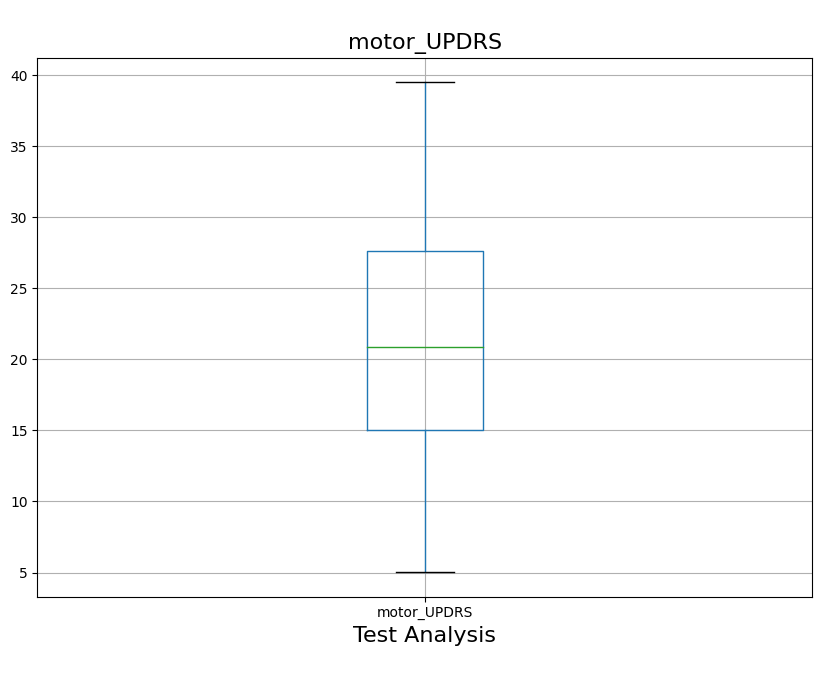

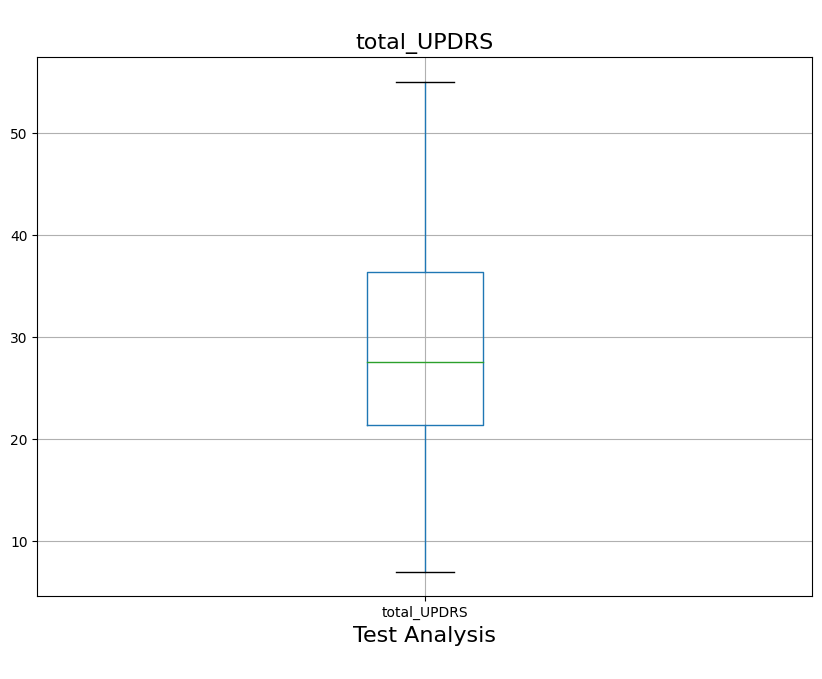

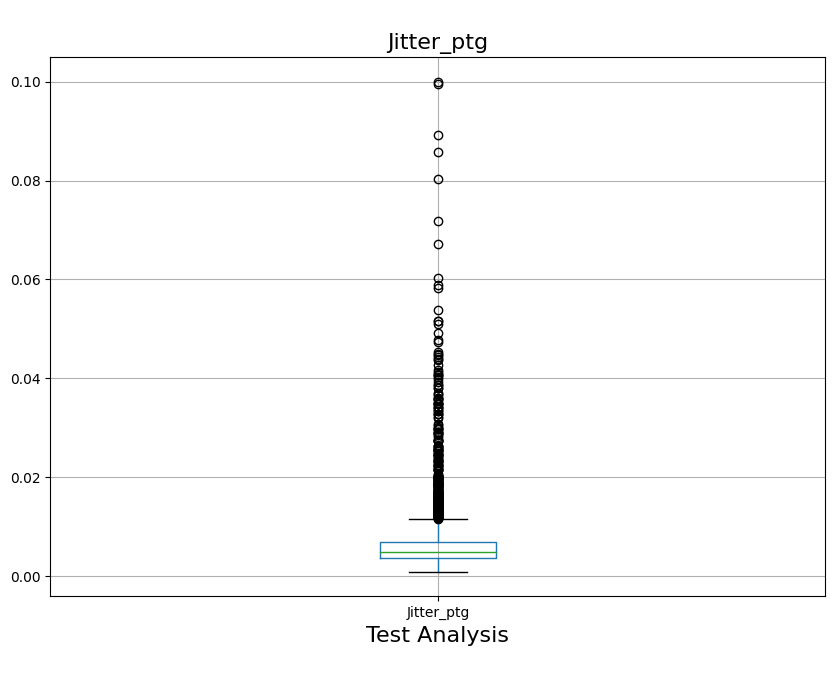

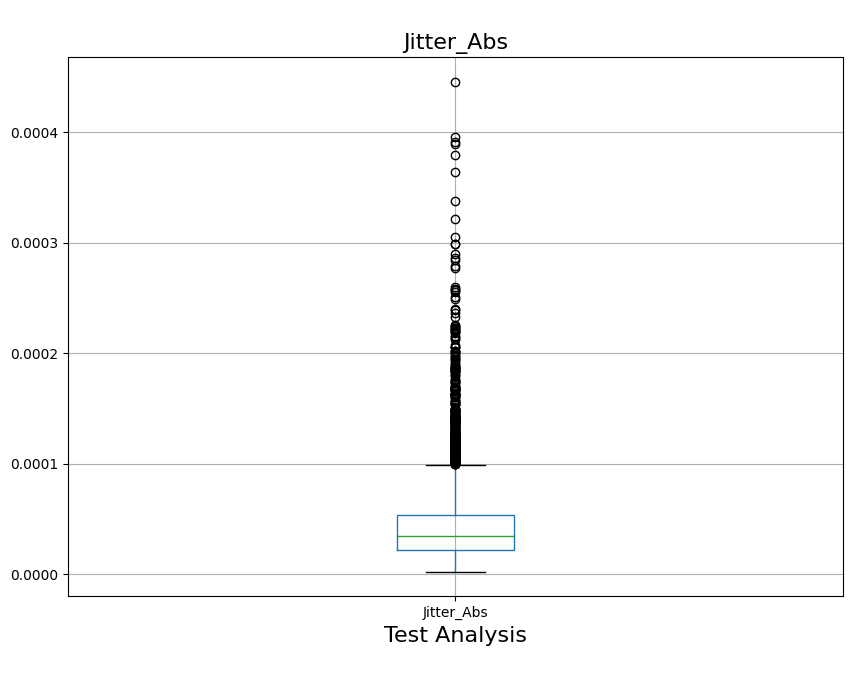

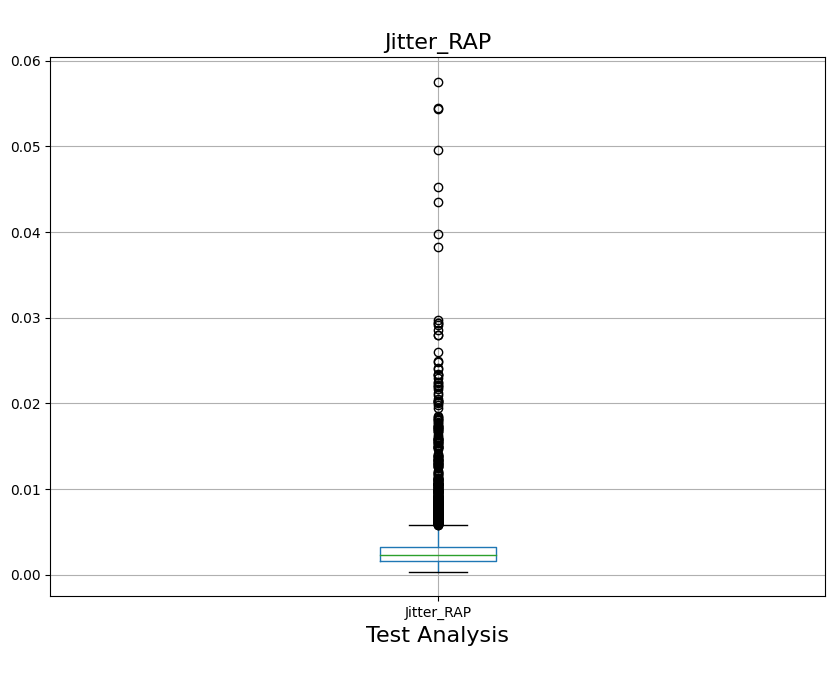

...

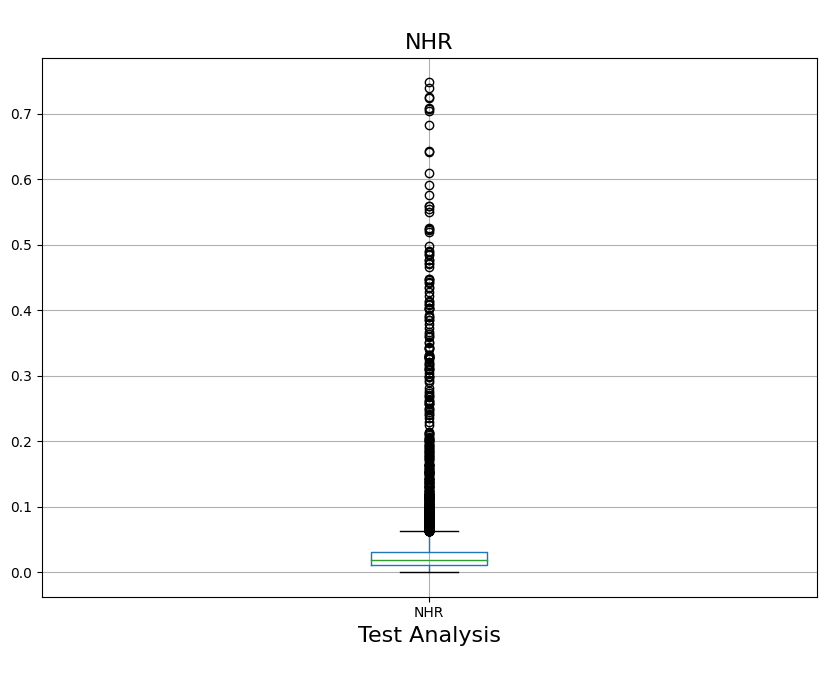

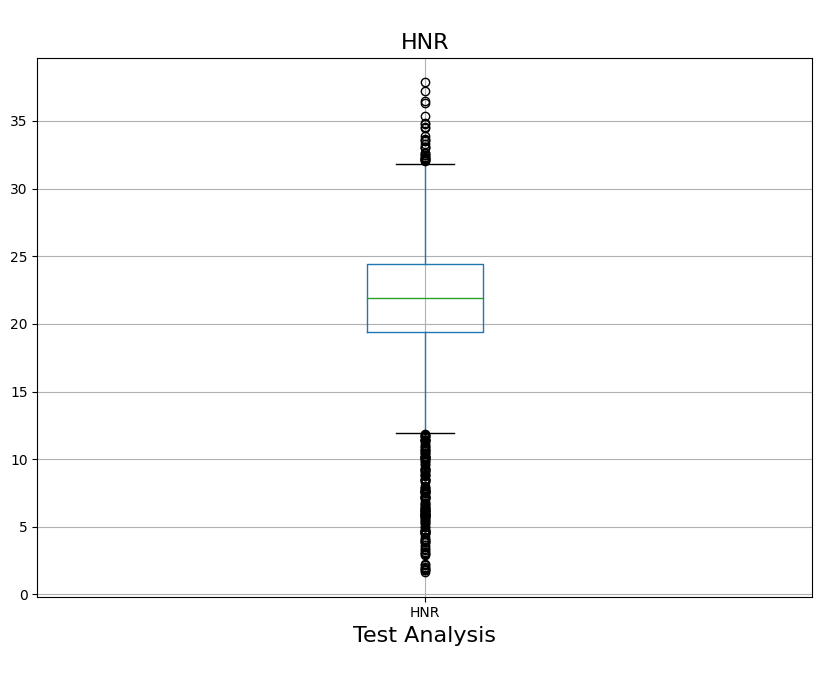

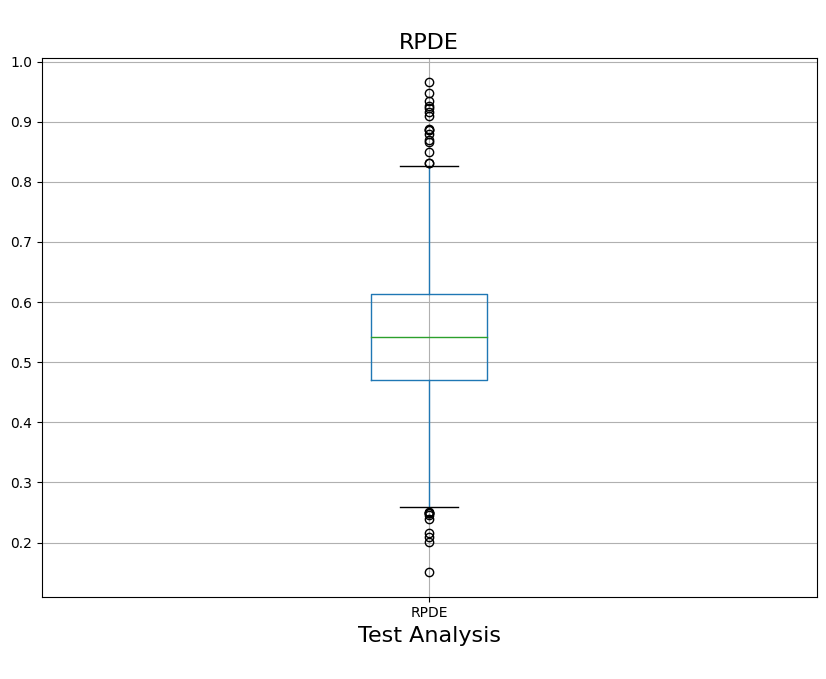

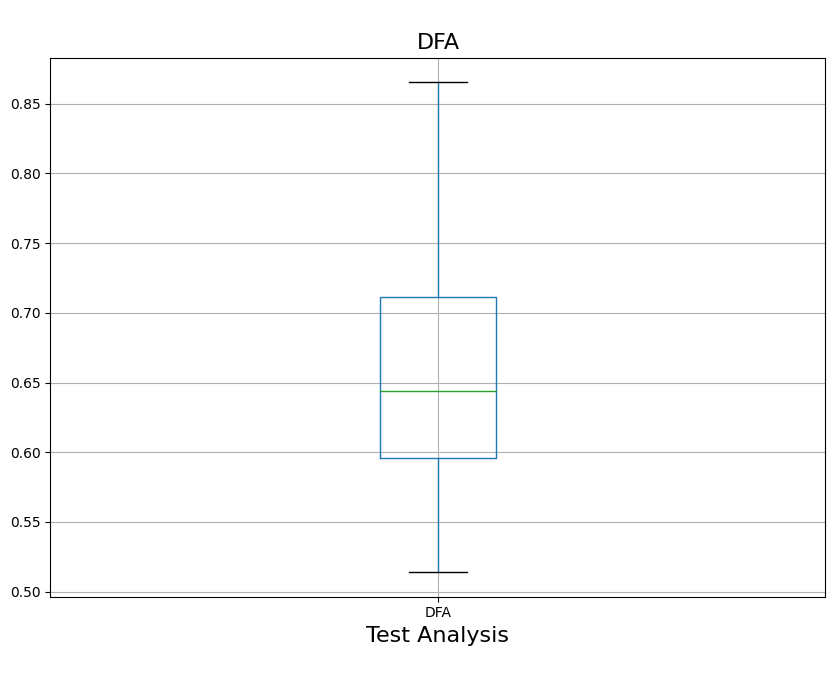

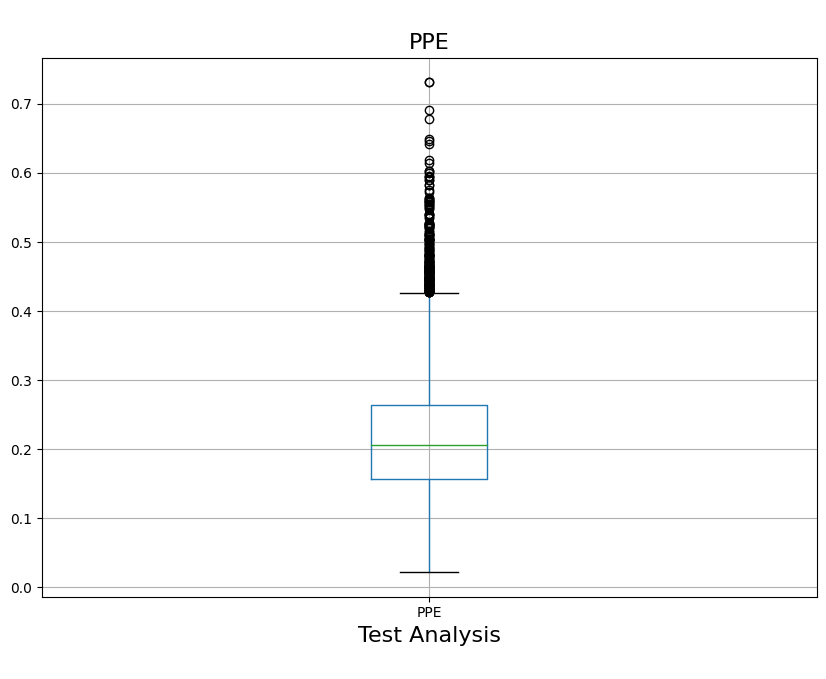

In [7]:
# Se realizan gráficas boxplot de cada una de las variables
for c in df.columns[4:]:
    df.boxplot(c, figsize=(10,7),fontsize=10)
    plt.title("\n{}".format(c),fontsize=16)
    plt.xlabel("Test Analysis\n", fontsize=16)
    plt.show()


# **Eliminación de outliers de cada una de las variables**

In [10]:
# Se realiza calulo de los cuartiles para cada una de las columnas
q1 = df.quantile(0.25)  # primer cuartil
q3 = df.quantile(0.75)  # segundo cuartil
iqr = q3 - q1           # cálculo del rango intercaurtílico

# Definición de límites para identificar los outliers de cada una de las columnas
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Se identifican los outliers para cada columna
outliers = (df <= lower_bound) | (df >= upper_bound)

# Se eliminan los outliers de cada columna y se muestra el dataframe sin outliers

clean_data = df[~outliers.any(axis=1)]
print(clean_data)

# Muestra la cantidad de ouliers presentes
print(f'Número de outliers: {len(outliers)}')


      subject#  age  sex  test_time  motor_UPDRS  total_UPDRS  Jitter_ptg  \
0            1   72    0     5.6431       28.199       34.398     0.00662   
1            1   72    0    12.6660       28.447       34.894     0.00300   
2            1   72    0    19.6810       28.695       35.389     0.00481   
3            1   72    0    25.6470       28.905       35.810     0.00528   
4            1   72    0    33.6420       29.187       36.375     0.00335   
...        ...  ...  ...        ...          ...          ...         ...   
5870        42   61    0   142.7900       22.485       33.485     0.00406   
5871        42   61    0   149.8400       21.988       32.988     0.00297   
5872        42   61    0   156.8200       21.495       32.495     0.00349   
5873        42   61    0   163.7300       21.007       32.007     0.00281   
5874        42   61    0   170.7300       20.513       31.513     0.00282   

      Jitter_Abs  Jitter_RAP  Jitter_PPQ5  ...  Shimmer_dB  Shimmer_APQ3  \

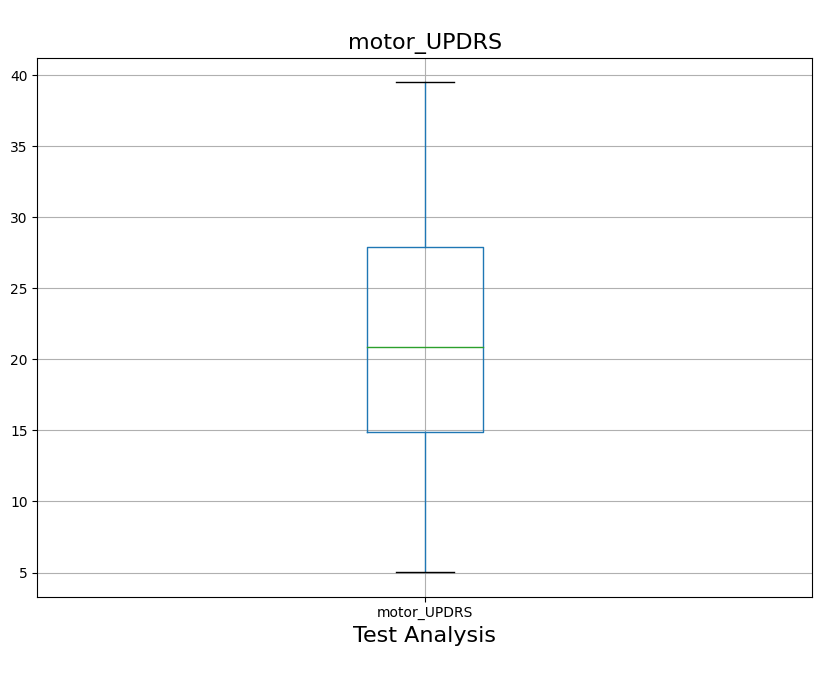

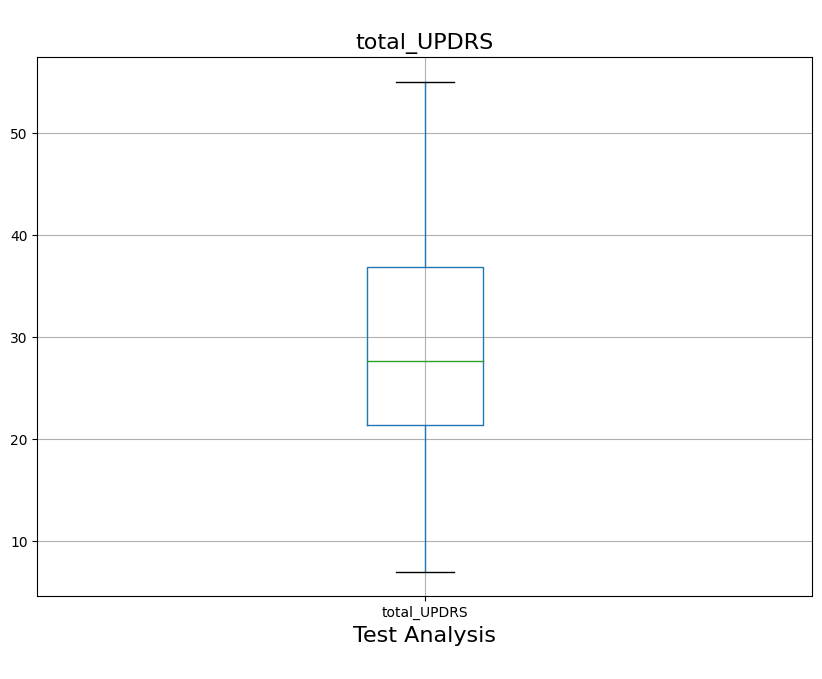

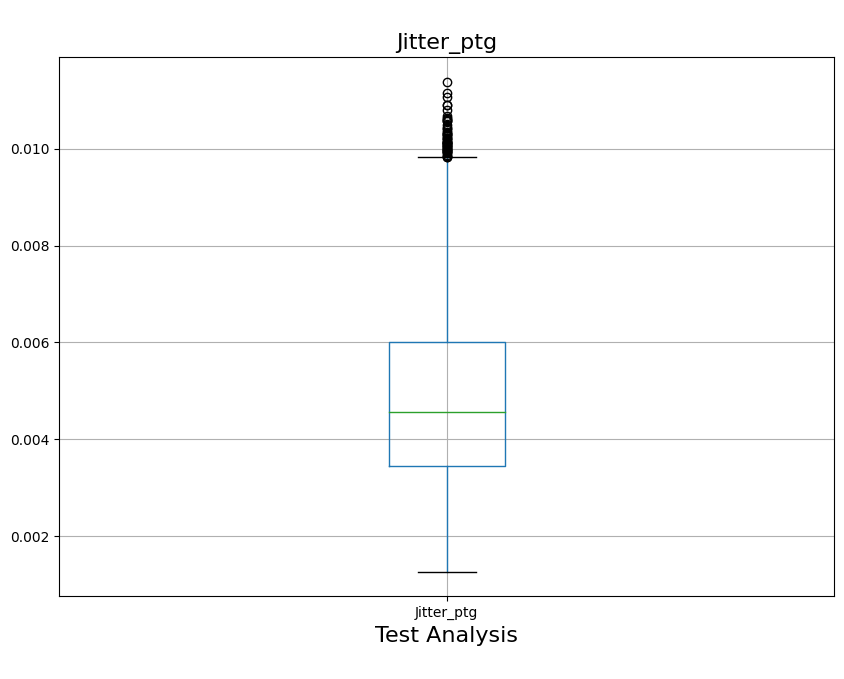

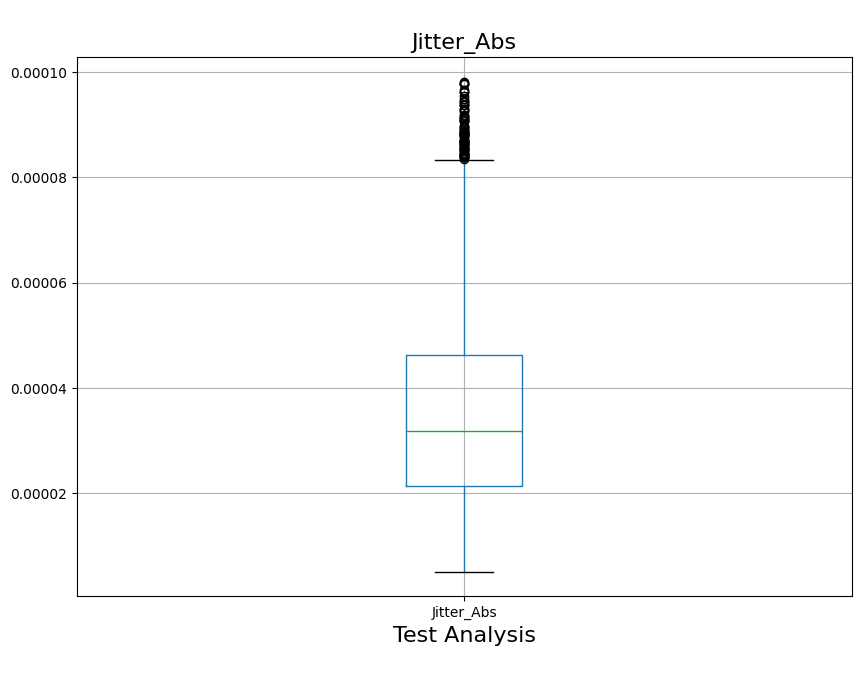

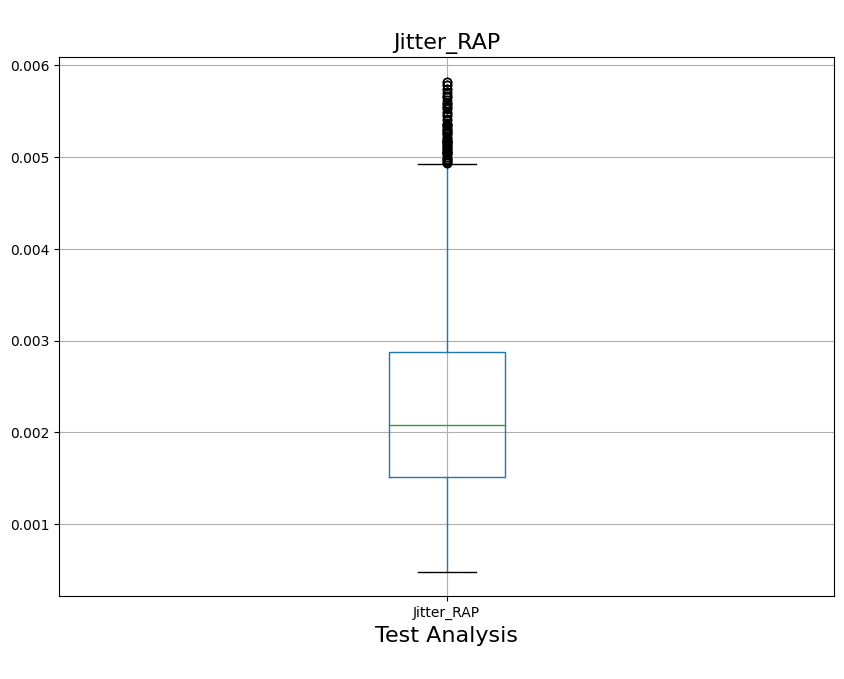

...

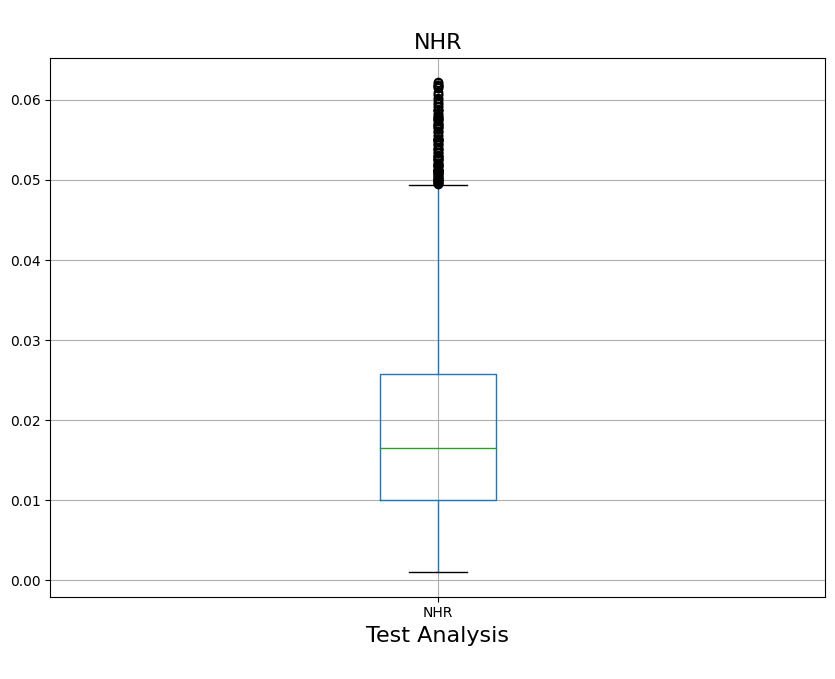

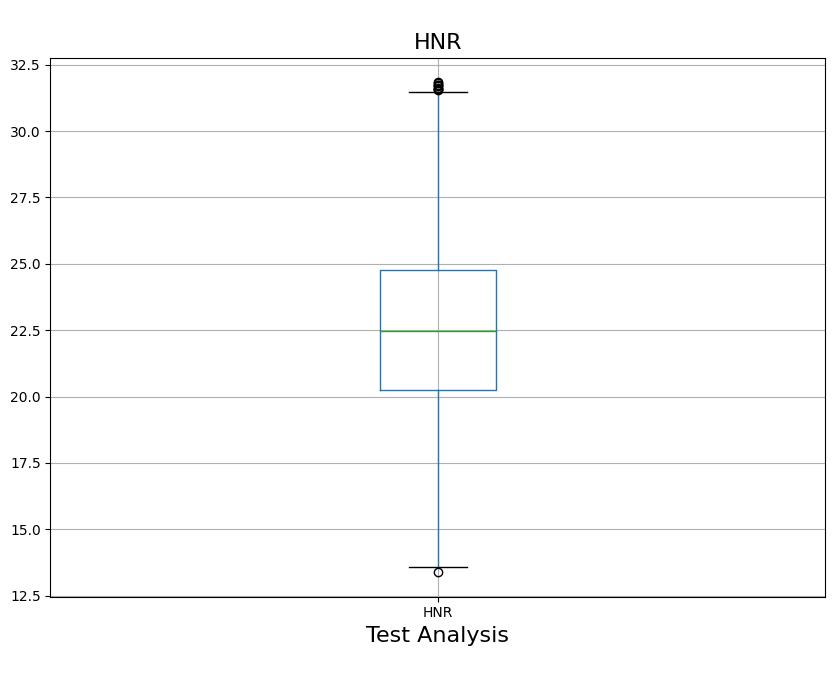

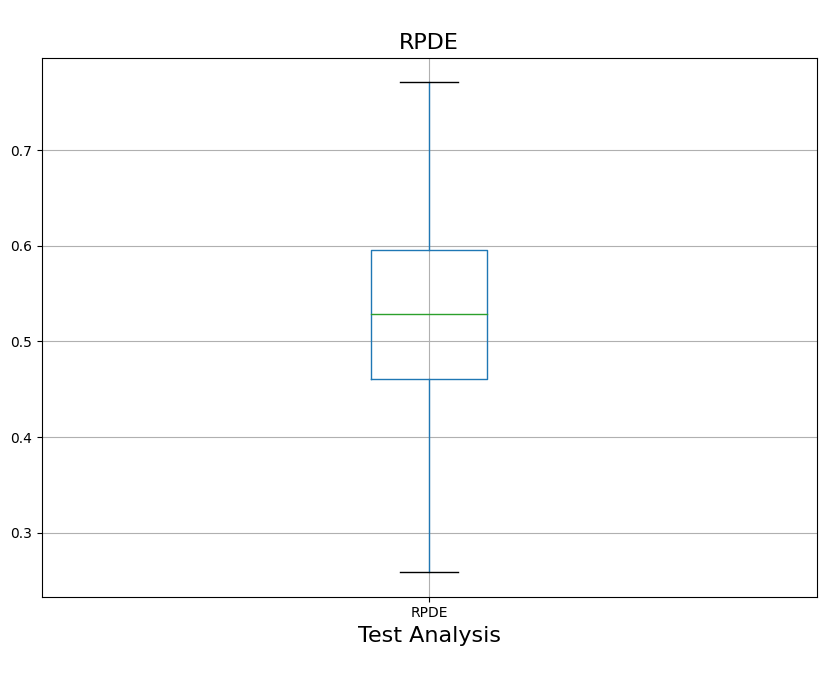

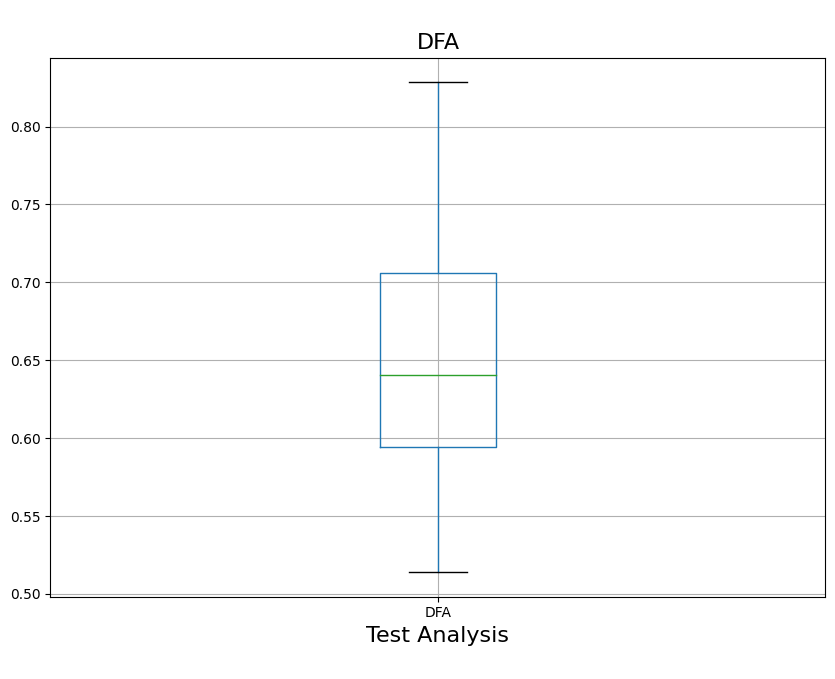

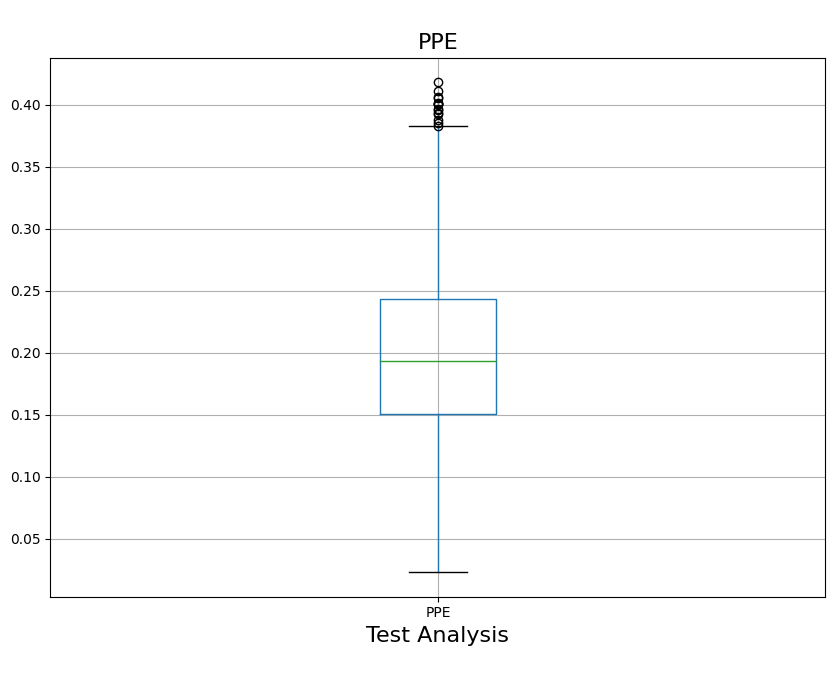

In [13]:
# Se muestran gráficas boxplot del dataframe con los outliers excluídos

for c in clean_data.columns[4:]:
    clean_data.boxplot(c, figsize=(10,7),fontsize=10)
    plt.title("\n{}".format(c),fontsize=16)
    plt.xlabel("Test Analysis\n", fontsize=16)
    plt.show()

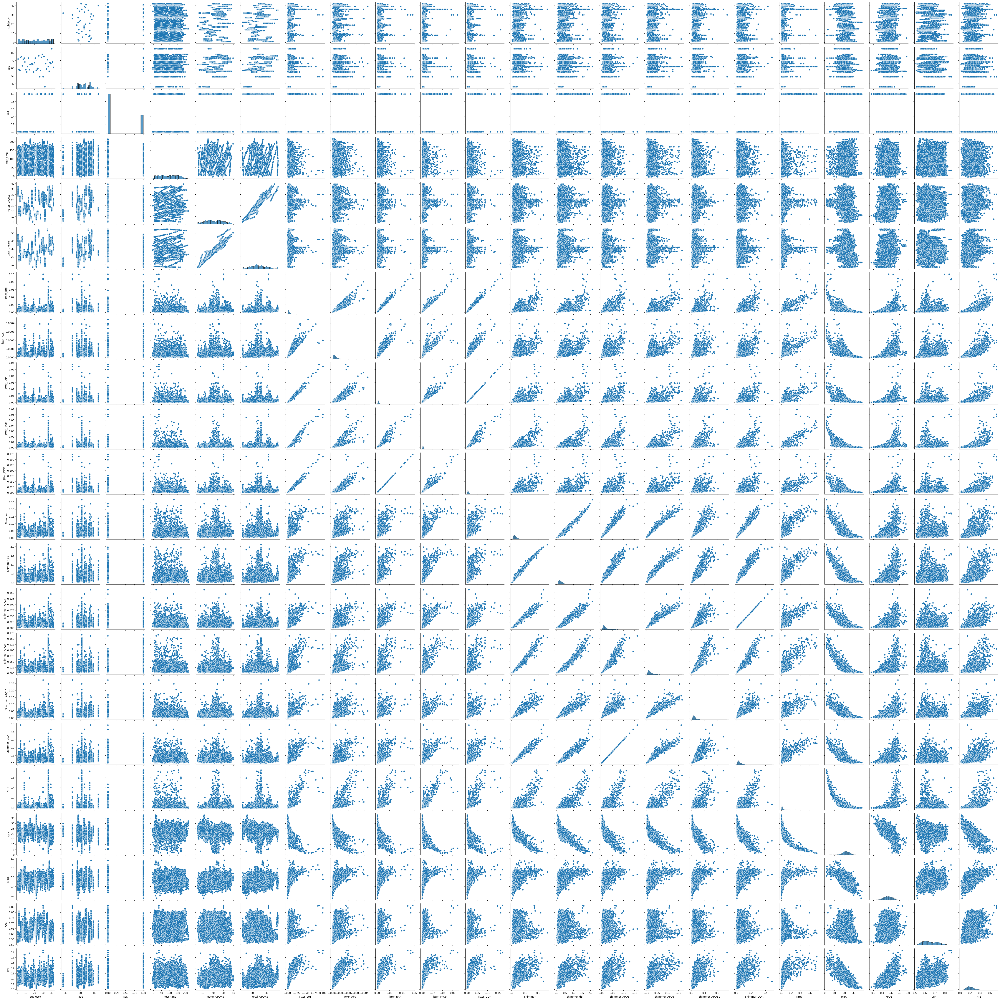

In [9]:
# Se aplica pairplot a todo el dataset para visualizar comportamientos entre variables
sns.pairplot(df)


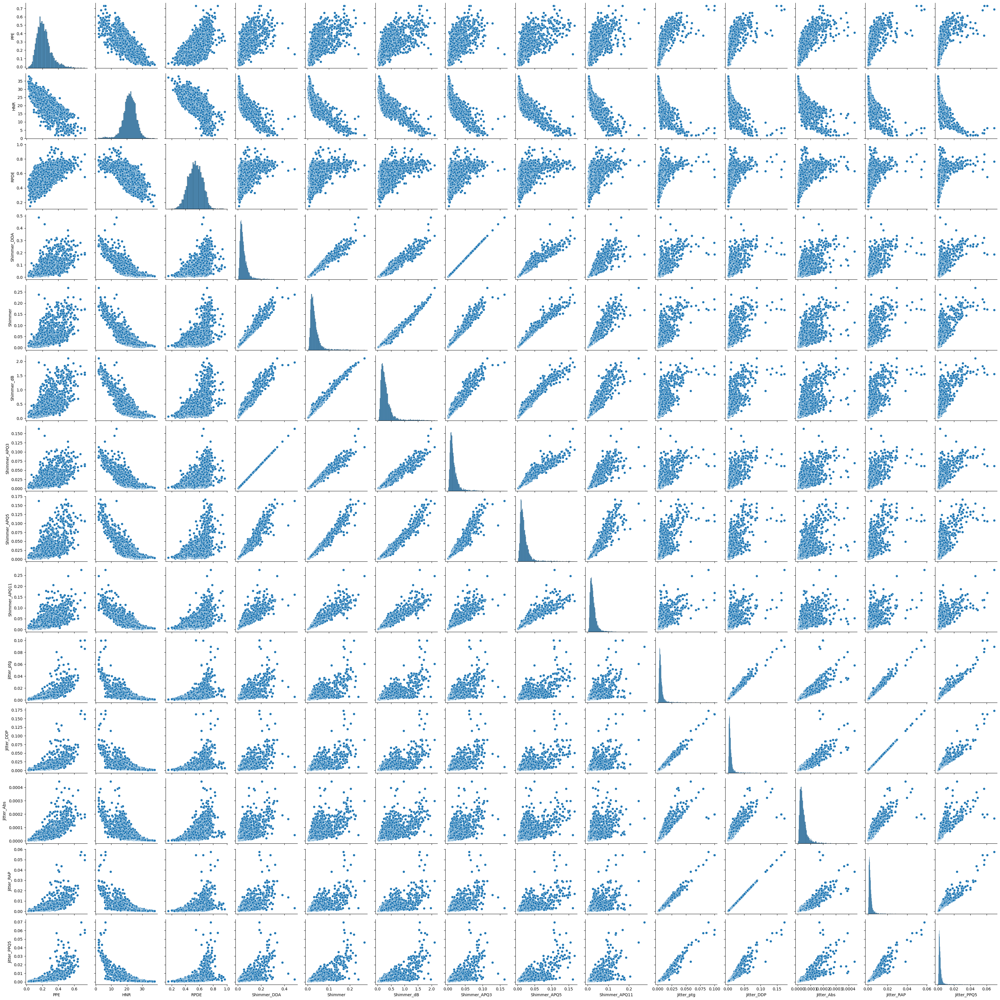

In [10]:
# Se aplica pairplot a las variables que en el punto anteriror se les observan comportamientos con alguna tendencia
sns.pairplot(df, vars = ["PPE", "HNR","RPDE","Shimmer_DDA","Shimmer","Shimmer_dB","Shimmer_APQ3","Shimmer_APQ5","Shimmer_APQ11","Jitter_ptg","Jitter_DDP","Jitter_Abs","Jitter_RAP","Jitter_PPQ5"])

# **Coeficiente de correlación de Pearson**

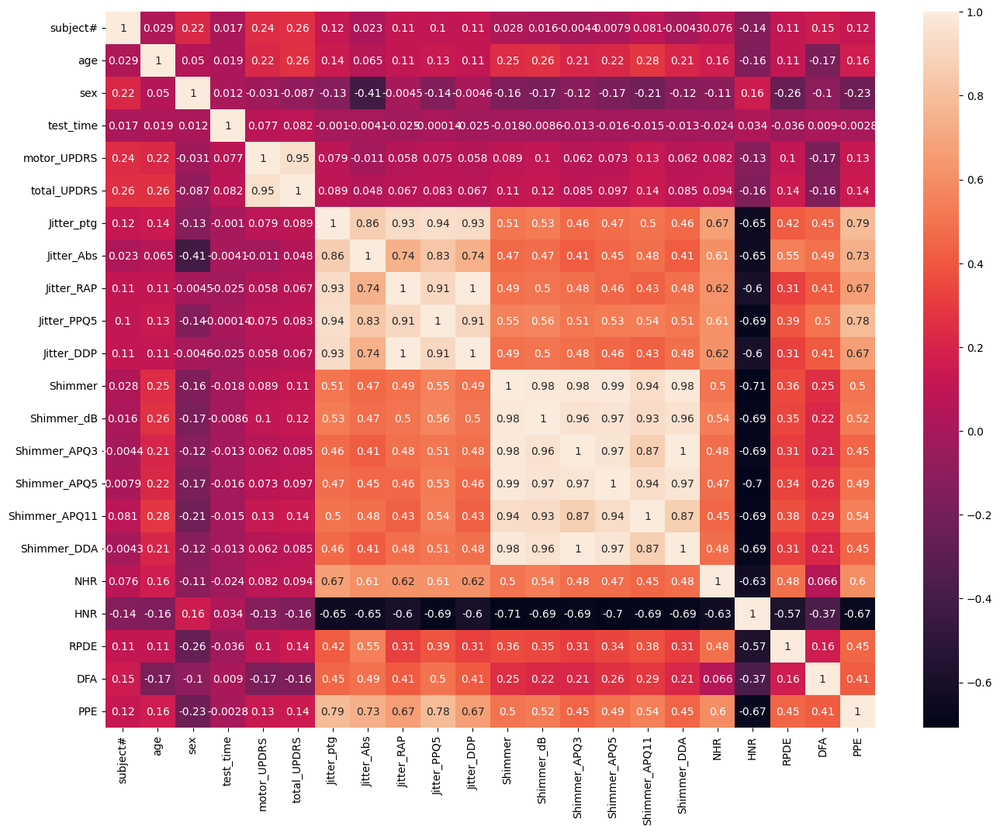

In [14]:
# Coeficiente de correlación de Pearson al dataset con outliers eliminados

corr_df = clean_data.corr(method='pearson')
plt.figure(figsize=(16, 12))
sns.heatmap(corr_df, annot=True)
plt.show()

# **Análisis de variables objetivo para el modelado**

In [15]:
# Obtención de las características de la base de datos sin las variables objetivo.
features = df.drop(['motor_UPDRS','total_UPDRS'], axis=1)
features.head(10)

,subject#,age,sex,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
5,1,72,0,40.6520,0.00353,0.000023,0.00119,0.00159,0.00357,0.02227,0.214,0.01006,0.01337,0.02263,0.03019,0.009438,22.946,0.53949,0.57243,0.19500
6,1,72,0,47.6490,0.00422,0.000024,0.00212,0.00221,0.00637,0.04352,0.445,0.02376,0.02621,0.03488,0.07128,0.013260,22.506,0.49250,0.54779,0.17563
7,1,72,0,54.6400,0.00476,0.000025,0.00226,0.00259,0.00678,0.02191,0.212,0.00979,0.01462,0.01911,0.02937,0.027969,22.929,0.47712,0.54234,0.23844
8,1,72,0,61.6690,0.00432,0.000029,0.00156,0.00207,0.00468,0.04296,0.371,0.01774,0.02134,0.03451,0.05323,0.013381,22.078,0.51563,0.61864,0.20037
9,1,72,0,68.6880,0.00496,0.000027,0.00258,0.00253,0.00773,0.03610,0.310,0.02030,0.01970,0.02569,0.06089,0.018021,22.606,0.50032,0.58673,0.20117


In [14]:
# Se obtienen etiquetas de una de las variables objetivo
labels = df['total_UPDRS']
labels.head()

0    34.398
1    34.894
2    35.389
3    35.810
4    36.375
Name: total_UPDRS, dtype: float64

In [15]:
# Separación de los datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(features, labels,
                                                    test_size=0.20, random_state=1)

In [16]:
# Verificacion de la cantidad de datos para entrenamiento y para prueba
print("y_train labels unique:",np.unique(y_train, return_counts=True))
print("y_test labels unique: ",np.unique(y_test, return_counts=True))

y_train labels unique: (array([ 7.    ,  7.0881,  7.0883, ..., 54.868 , 54.948 , 54.992 ]), array([43,  2,  3, ...,  6,  4,  2]))
y_test labels unique:  (array([ 7.    ,  7.0882,  7.0982,  7.3119,  7.3842,  7.4552,  7.5978,
        7.6493,  7.6494,  7.7409,  7.8128,  7.8841,  7.9555,  8.0357,
        8.0358,  8.8216,  9.2144,  9.346 ,  9.784 ,  9.8927,  9.8928,
        9.8929,  9.9863,  9.9866, 10.324 , 10.423 , 10.764 , 10.765 ,
       10.858 , 11.261 , 11.262 , 11.345 , 11.397 , 11.496 , 11.541 ,
       11.882 , 11.94  , 11.941 , 12.169 , 12.318 , 12.319 , 12.469 ,
       12.497 , 12.652 , 13.01  , 13.11  , 13.289 , 13.615 , 13.618 ,
       13.658 , 13.725 , 13.876 , 13.94  , 14.011 , 14.039 , 14.18  ,
       14.314 , 14.321 , 14.342 , 14.359 , 14.391 , 14.553 , 14.604 ,
       14.694 , 14.734 , 14.746 , 14.816 , 14.917 , 14.936 , 14.953 ,
       14.957 , 15.004 , 15.03  , 15.183 , 15.264 , 15.32  , 15.419 ,
       15.448 , 15.559 , 15.573 , 15.655 , 15.717 , 15.858 , 15.859 ,
      

In [17]:
# Se realiza un escalamiento a los datos
scalar = preprocessing.StandardScaler()
scaled_data = pd.DataFrame(scalar.fit_transform(features))
scaled_data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-1.656596,0.815695,-0.682509,-1.632090,0.082905,-0.284242,0.327453,-0.028637,0.328505,-0.324594,-0.351642,-0.209709,-0.423356,-0.543466,-0.209704,-0.298721,-0.009205,-1.214066,-1.478500,-0.650658
1,-1.656596,0.815695,-0.682509,-1.500676,-0.560793,-0.756723,-0.533746,-0.476212,-0.534825,-0.534016,-0.573156,-0.545158,-0.565592,-0.529955,-0.545153,-0.351965,1.282650,-1.055119,-1.247880,-1.218585
2,-1.656596,0.815695,-0.682509,-1.369410,-0.238944,-0.539382,-0.300038,-0.320767,-0.298983,-0.669115,-0.564469,-0.741592,-0.702426,-0.645545,-0.741587,-0.199370,0.318711,-0.784860,-1.540139,-0.103280
3,-1.656596,0.815695,-0.682509,-1.257773,-0.155370,-0.485186,-0.344859,-0.170682,-0.344871,-0.423692,0.069668,-0.460540,-0.449763,-0.392849,-0.460787,-0.071754,0.644530,-0.536487,-1.062115,1.237075
4,-1.656596,0.815695,-0.682509,-1.108169,-0.498557,-0.663894,-0.658604,-0.529814,-0.659682,-0.658276,-0.586186,-0.783145,-0.651413,-0.464905,-0.783392,-0.343370,1.036305,-0.689195,-1.297953,-0.283954


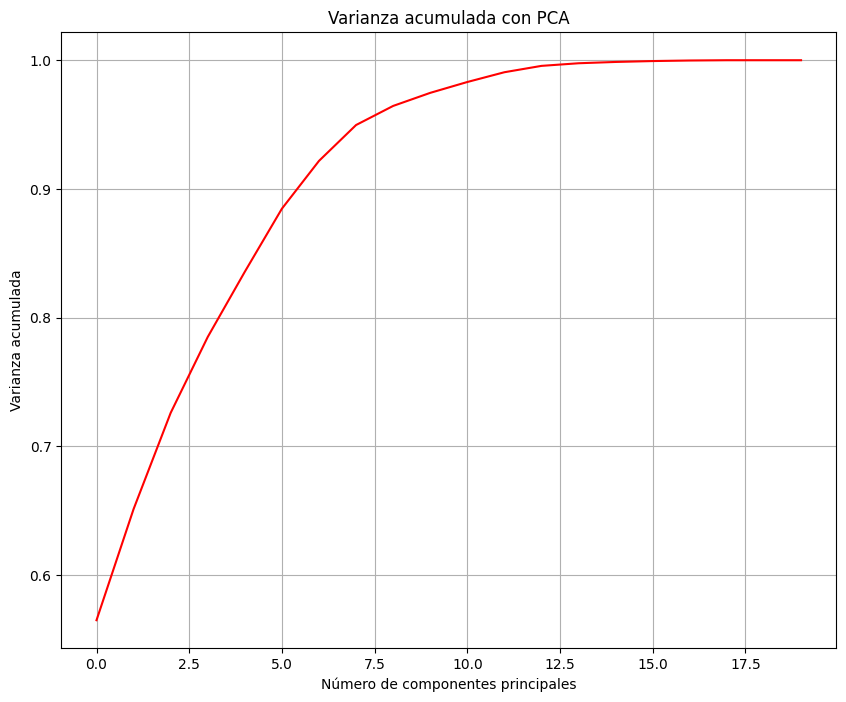

In [18]:
# PCA con varianza acumulada
pca = PCA()
pca.fit(scaled_data)
data_pca = pca.transform(scaled_data)
data_pca = pd.DataFrame(scaled_data)
data_pca.head()

# Grafica de la varianza

plt.figure(figsize = (10, 8))
plt.plot(list(range(scaled_data.shape[1])), np.cumsum(pca.explained_variance_ratio_), 'r-')
plt.grid()
plt.xlabel('Número de componentes principales'); plt.ylabel('Varianza acumulada');
plt.title('Varianza acumulada con PCA');

In [19]:
# Preparación del PCA para ver el impacto de las características

loadings = pd.DataFrame(
    data=pca.components_.T * np.sqrt(pca.explained_variance_),
    columns=[f'PC{i}' for i in range(1, len(X_train.columns) + 1)],
    index=X_train.columns
)
loadings.head(15)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
subject#,0.177558,0.072011,0.283643,-0.803897,-0.105124,-0.169073,-0.115506,0.427034,0.008385,0.034544,-0.005112,-0.009724,-0.004746,-0.003027,0.000375,-0.000956,0.000475,-0.000470,-5.100416e-09,-7.799930e-12
age,0.084506,0.219537,-0.270733,0.173211,-0.517932,-0.690801,0.297495,0.040035,0.069666,-0.015045,-0.024214,-0.015244,-0.008297,0.000020,0.001001,-0.000768,0.000113,0.000042,-4.064539e-10,1.195696e-10
sex,0.037420,0.293365,0.722151,-0.319001,-0.089990,-0.089565,0.181918,-0.485347,-0.012276,0.041211,0.021447,-0.040544,0.024225,-0.011218,-0.000643,0.001448,-0.000269,-0.000045,8.901254e-09,-4.251231e-11
test_time,-0.034254,-0.043531,-0.025794,-0.018577,-0.834077,0.536335,-0.109916,-0.021071,0.011952,0.000719,0.001983,0.007896,0.004005,0.000716,0.000343,-0.000516,0.000185,0.000100,-4.382607e-09,2.623102e-10
Jitter_ptg,0.894321,-0.341633,0.227698,0.114679,-0.038503,-0.055024,0.014672,0.041052,0.032194,0.003563,0.048447,0.042966,0.001162,-0.007797,-0.020453,0.001282,-0.080602,0.004280,1.863722e-08,4.179518e-09
Jitter_Abs,0.835731,-0.420267,-0.080990,0.053868,-0.021441,-0.042975,-0.046447,0.004691,-0.051677,0.135930,-0.095245,-0.232828,0.155218,-0.050737,-0.002912,0.002104,0.006693,-0.000612,-3.591619e-09,-4.372194e-10
Jitter_RAP,0.867769,-0.351483,0.271220,0.137648,-0.029210,-0.047369,0.042874,0.038990,0.068599,0.088945,0.028431,0.079401,0.007993,0.061829,0.013481,-0.018060,0.022794,-0.000303,-4.345368e-04,-3.346872e-07
Jitter_PPQ5,0.888271,-0.249227,0.275501,0.133990,-0.027116,-0.027266,0.016461,0.058366,0.056075,-0.126238,0.038479,0.076163,-0.053616,-0.135681,-0.011956,0.038305,0.027383,-0.003870,-5.531980e-08,-1.604512e-09
Jitter_DDP,0.867774,-0.351487,0.271210,0.137641,-0.029220,-0.047361,0.042880,0.039010,0.068590,0.088926,0.028422,0.079406,0.007997,0.061826,0.013464,-0.018032,0.022801,-0.000301,4.345746e-04,3.327837e-07
Shimmer,0.934861,0.319849,-0.065311,0.017210,0.039268,0.091113,0.043073,0.030930,0.016211,0.015578,0.019300,-0.024818,-0.016894,0.000946,-0.038432,-0.004786,0.010002,0.057492,-2.633777e-08,-4.793255e-09


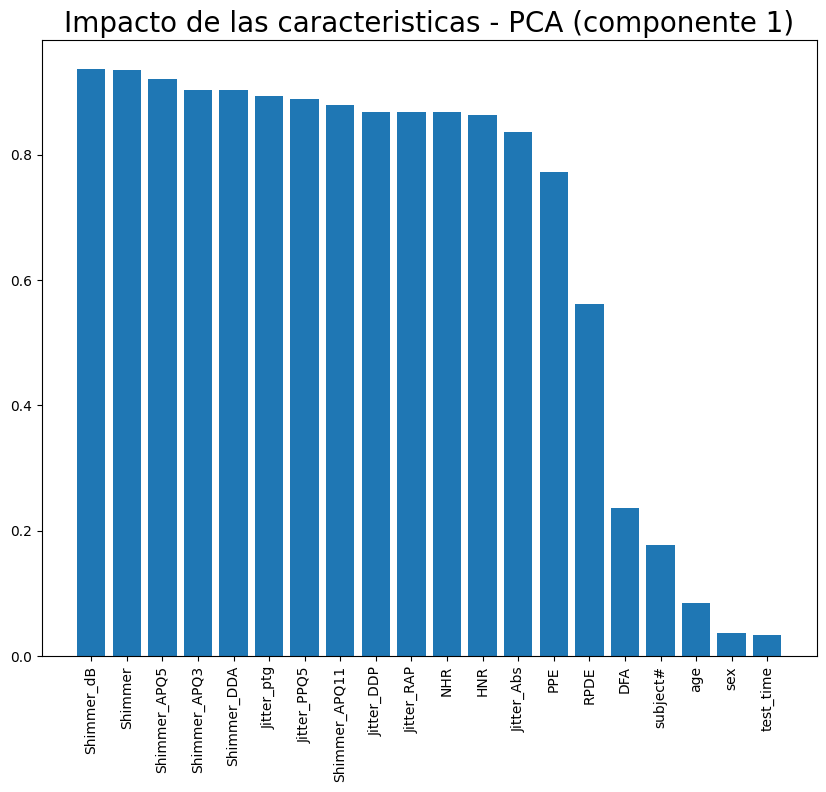

In [20]:
# Analizar el impacto de las características según la primera componente del PCA
pc1_loadings = abs(loadings).sort_values(by='PC1', ascending=False)[['PC1']]
pc1_loadings = pc1_loadings.reset_index()
pc1_loadings.columns = ['Feature', 'CorrelationWithPC1']

# Gráfica del impacto de las características
plt.figure(figsize = (10, 8))
plt.bar(x=pc1_loadings['Feature'], height=pc1_loadings['CorrelationWithPC1'])
plt.title('Impacto de las caracteristicas - PCA (componente 1)', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [21]:
# Obtención de las características de la base de datos sin las variables objetivo.
features = df.drop(['motor_UPDRS','total_UPDRS'], axis=1)
features.head(10)

,subject#,age,sex,test_time,Jitter_ptg,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,Shimmer,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
5,1,72,0,40.6520,0.00353,0.000023,0.00119,0.00159,0.00357,0.02227,0.214,0.01006,0.01337,0.02263,0.03019,0.009438,22.946,0.53949,0.57243,0.19500
6,1,72,0,47.6490,0.00422,0.000024,0.00212,0.00221,0.00637,0.04352,0.445,0.02376,0.02621,0.03488,0.07128,0.013260,22.506,0.49250,0.54779,0.17563
7,1,72,0,54.6400,0.00476,0.000025,0.00226,0.00259,0.00678,0.02191,0.212,0.00979,0.01462,0.01911,0.02937,0.027969,22.929,0.47712,0.54234,0.23844
8,1,72,0,61.6690,0.00432,0.000029,0.00156,0.00207,0.00468,0.04296,0.371,0.01774,0.02134,0.03451,0.05323,0.013381,22.078,0.51563,0.61864,0.20037
9,1,72,0,68.6880,0.00496,0.000027,0.00258,0.00253,0.00773,0.03610,0.310,0.02030,0.01970,0.02569,0.06089,0.018021,22.606,0.50032,0.58673,0.20117


In [22]:
# Obtención de etiquetas para la segunda variable objetivo
labels = df['motor_UPDRS']
labels.head()

0    28.199
1    28.447
2    28.695
3    28.905
4    29.187
Name: motor_UPDRS, dtype: float64

In [23]:
# Separación de los datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(features, labels,
                                                    test_size=0.20, random_state=1)

In [24]:
# Verificacion de la cantidad de datos para entrenamiento y para prueba
print("y_train labels unique:",np.unique(y_train, return_counts=True))
print("y_test labels unique: ",np.unique(y_test, return_counts=True))

y_train labels unique: (array([ 5.0377,  5.0378,  5.1375, ..., 37.664 , 37.957 , 39.511 ]), array([3, 2, 3, ..., 5, 5, 5]))
y_test labels unique:  (array([ 5.0378,  5.5373,  5.8371,  5.9369,  5.994 ,  5.9941,  6.    ,
        6.0102,  6.2347,  6.3846,  6.5408,  6.6924,  6.9987,  7.063 ,
        7.1038,  7.3451,  7.4545,  7.4546,  7.6165,  7.6466,  7.924 ,
        8.0103,  8.1633,  8.1853,  8.2199,  8.3098,  8.3171,  8.318 ,
        8.3181,  8.3883,  8.4496,  8.4671,  8.5458,  8.55  ,  8.6249,
        8.6516,  8.703 ,  8.7208,  8.7788,  8.7817,  8.8604,  8.9324,
        8.9325,  8.939 ,  8.9886,  9.0863,  9.0904,  9.0906,  9.2596,
        9.2893,  9.2894,  9.3273,  9.3274,  9.3742,  9.5479,  9.6153,
        9.635 ,  9.6352,  9.7017,  9.7558,  9.7995,  9.94  ,  9.9456,
        9.9457, 10.029 , 10.115 , 10.141 , 10.169 , 10.179 , 10.281 ,
       10.334 , 10.359 , 10.45  , 10.529 , 10.559 , 10.615 , 10.723 ,
       10.724 , 10.737 , 10.768 , 10.782 , 10.876 , 10.906 , 11.078 ,
       11.11

In [25]:
# Se realiza escalamiento a los datos
scalar = preprocessing.StandardScaler()
scaled_data = pd.DataFrame(scalar.fit_transform(features))
scaled_data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-1.656596,0.815695,-0.682509,-1.632090,0.082905,-0.284242,0.327453,-0.028637,0.328505,-0.324594,-0.351642,-0.209709,-0.423356,-0.543466,-0.209704,-0.298721,-0.009205,-1.214066,-1.478500,-0.650658
1,-1.656596,0.815695,-0.682509,-1.500676,-0.560793,-0.756723,-0.533746,-0.476212,-0.534825,-0.534016,-0.573156,-0.545158,-0.565592,-0.529955,-0.545153,-0.351965,1.282650,-1.055119,-1.247880,-1.218585
2,-1.656596,0.815695,-0.682509,-1.369410,-0.238944,-0.539382,-0.300038,-0.320767,-0.298983,-0.669115,-0.564469,-0.741592,-0.702426,-0.645545,-0.741587,-0.199370,0.318711,-0.784860,-1.540139,-0.103280
3,-1.656596,0.815695,-0.682509,-1.257773,-0.155370,-0.485186,-0.344859,-0.170682,-0.344871,-0.423692,0.069668,-0.460540,-0.449763,-0.392849,-0.460787,-0.071754,0.644530,-0.536487,-1.062115,1.237075
4,-1.656596,0.815695,-0.682509,-1.108169,-0.498557,-0.663894,-0.658604,-0.529814,-0.659682,-0.658276,-0.586186,-0.783145,-0.651413,-0.464905,-0.783392,-0.343370,1.036305,-0.689195,-1.297953,-0.283954


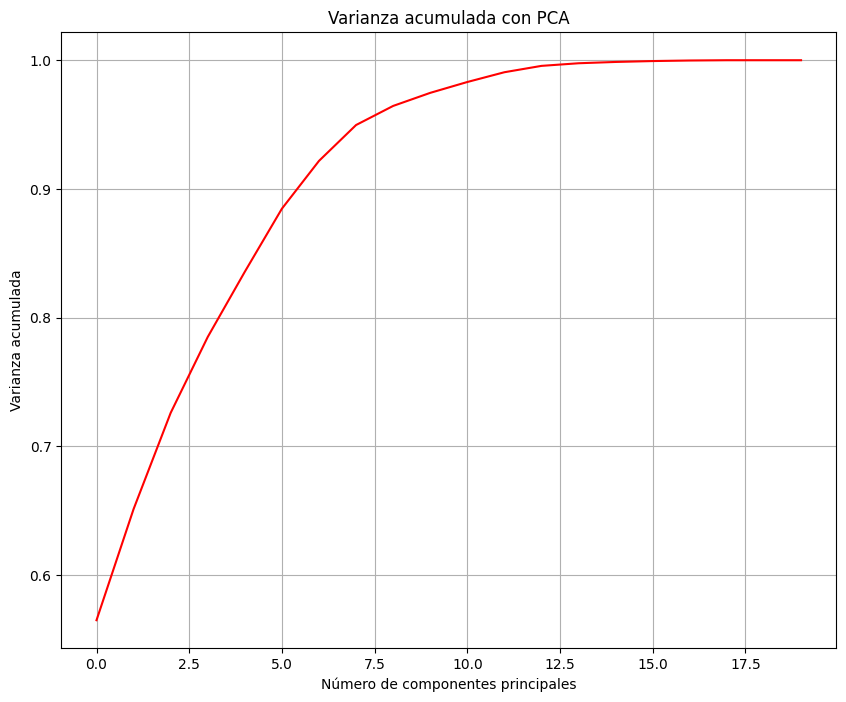

In [26]:
# PCA con varianza acumulada
pca = PCA()
pca.fit(scaled_data)
data_pca = pca.transform(scaled_data)
data_pca = pd.DataFrame(scaled_data)
data_pca.head()

# Grafica de la varianza acumulada

plt.figure(figsize = (10, 8))
plt.plot(list(range(scaled_data.shape[1])), np.cumsum(pca.explained_variance_ratio_), 'r-')
plt.grid()
plt.xlabel('Número de componentes principales'); plt.ylabel('Varianza acumulada');
plt.title('Varianza acumulada con PCA');

In [27]:
# Preparación del PCA para ver el impacto de las características
loadings = pd.DataFrame(
    data=pca.components_.T * np.sqrt(pca.explained_variance_),
    columns=[f'PC{i}' for i in range(1, len(X_train.columns) + 1)],
    index=X_train.columns
)
loadings.head(15)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
subject#,0.177558,0.072011,0.283643,-0.803897,-0.105124,-0.169073,-0.115506,0.427034,0.008385,0.034544,-0.005112,-0.009724,-0.004746,-0.003027,0.000375,-0.000956,0.000475,-0.000470,-5.100416e-09,-7.799930e-12
age,0.084506,0.219537,-0.270733,0.173211,-0.517932,-0.690801,0.297495,0.040035,0.069666,-0.015045,-0.024214,-0.015244,-0.008297,0.000020,0.001001,-0.000768,0.000113,0.000042,-4.064539e-10,1.195696e-10
sex,0.037420,0.293365,0.722151,-0.319001,-0.089990,-0.089565,0.181918,-0.485347,-0.012276,0.041211,0.021447,-0.040544,0.024225,-0.011218,-0.000643,0.001448,-0.000269,-0.000045,8.901254e-09,-4.251231e-11
test_time,-0.034254,-0.043531,-0.025794,-0.018577,-0.834077,0.536335,-0.109916,-0.021071,0.011952,0.000719,0.001983,0.007896,0.004005,0.000716,0.000343,-0.000516,0.000185,0.000100,-4.382607e-09,2.623102e-10
Jitter_ptg,0.894321,-0.341633,0.227698,0.114679,-0.038503,-0.055024,0.014672,0.041052,0.032194,0.003563,0.048447,0.042966,0.001162,-0.007797,-0.020453,0.001282,-0.080602,0.004280,1.863722e-08,4.179518e-09
Jitter_Abs,0.835731,-0.420267,-0.080990,0.053868,-0.021441,-0.042975,-0.046447,0.004691,-0.051677,0.135930,-0.095245,-0.232828,0.155218,-0.050737,-0.002912,0.002104,0.006693,-0.000612,-3.591619e-09,-4.372194e-10
Jitter_RAP,0.867769,-0.351483,0.271220,0.137648,-0.029210,-0.047369,0.042874,0.038990,0.068599,0.088945,0.028431,0.079401,0.007993,0.061829,0.013481,-0.018060,0.022794,-0.000303,-4.345368e-04,-3.346872e-07
Jitter_PPQ5,0.888271,-0.249227,0.275501,0.133990,-0.027116,-0.027266,0.016461,0.058366,0.056075,-0.126238,0.038479,0.076163,-0.053616,-0.135681,-0.011956,0.038305,0.027383,-0.003870,-5.531980e-08,-1.604512e-09
Jitter_DDP,0.867774,-0.351487,0.271210,0.137641,-0.029220,-0.047361,0.042880,0.039010,0.068590,0.088926,0.028422,0.079406,0.007997,0.061826,0.013464,-0.018032,0.022801,-0.000301,4.345746e-04,3.327837e-07
Shimmer,0.934861,0.319849,-0.065311,0.017210,0.039268,0.091113,0.043073,0.030930,0.016211,0.015578,0.019300,-0.024818,-0.016894,0.000946,-0.038432,-0.004786,0.010002,0.057492,-2.633777e-08,-4.793255e-09


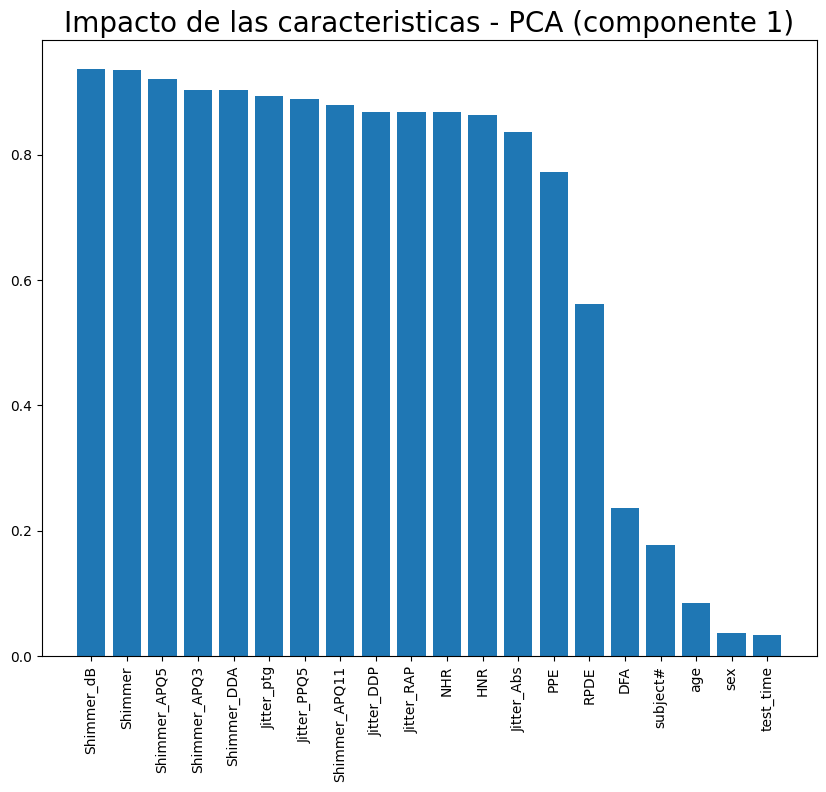

In [28]:
# Analizar el impacto de las características según la primera componente del PCA
pc1_loadings = abs(loadings).sort_values(by='PC1', ascending=False)[['PC1']]
pc1_loadings = pc1_loadings.reset_index()
pc1_loadings.columns = ['Feature', 'CorrelationWithPC1']

plt.figure(figsize = (10, 8))
plt.bar(x=pc1_loadings['Feature'], height=pc1_loadings['CorrelationWithPC1'])
plt.title('Impacto de las caracteristicas - PCA (componente 1)', size=20)
plt.xticks(rotation='vertical')
plt.show()

# **Regresión para primera variable objetivo con los datos originales**

In [29]:
# Se almacena la variable features en un dataframe llamado df_1
df_1=features
df_1

,subject#,age,sex,test_time,Jitter_ptg,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,Shimmer,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,42,61,0,142.7900,0.00406,0.000031,0.00167,0.00168,0.00500,0.01896,0.160,0.00973,0.01133,0.01549,0.02920,0.025137,22.369,0.64215,0.55314,0.21367
5871,42,61,0,149.8400,0.00297,0.000025,0.00119,0.00147,0.00358,0.02315,0.215,0.01052,0.01277,0.01904,0.03157,0.011927,22.886,0.52598,0.56518,0.12621
5872,42,61,0,156.8200,0.00349,0.000025,0.00152,0.00187,0.00456,0.02499,0.244,0.01371,0.01456,0.01877,0.04112,0.017701,25.065,0.47792,0.57888,0.14157
5873,42,61,0,163.7300,0.00281,0.000020,0.00128,0.00151,0.00383,0.01484,0.131,0.00693,0.00870,0.01307,0.02078,0.007984,24.422,0.56865,0.56327,0.14204


In [30]:
# Se obtienen las características de la primera variable objetivo
features_1 = df.drop(['motor_UPDRS'], axis=1)
features_1.head(10)

,subject#,age,sex,test_time,total_UPDRS,Jitter_ptg,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,...,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,34.398,0.00662,0.000034,0.00401,0.00317,0.01204,...,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,34.894,0.00300,0.000017,0.00132,0.00150,0.00395,...,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,35.389,0.00481,0.000025,0.00205,0.00208,0.00616,...,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,35.810,0.00528,0.000027,0.00191,0.00264,0.00573,...,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,36.375,0.00335,0.000020,0.00093,0.00130,0.00278,...,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
5,1,72,0,40.6520,36.870,0.00353,0.000023,0.00119,0.00159,0.00357,...,0.214,0.01006,0.01337,0.02263,0.03019,0.009438,22.946,0.53949,0.57243,0.19500
6,1,72,0,47.6490,37.363,0.00422,0.000024,0.00212,0.00221,0.00637,...,0.445,0.02376,0.02621,0.03488,0.07128,0.013260,22.506,0.49250,0.54779,0.17563
7,1,72,0,54.6400,37.857,0.00476,0.000025,0.00226,0.00259,0.00678,...,0.212,0.00979,0.01462,0.01911,0.02937,0.027969,22.929,0.47712,0.54234,0.23844
8,1,72,0,61.6690,38.353,0.00432,0.000029,0.00156,0.00207,0.00468,...,0.371,0.01774,0.02134,0.03451,0.05323,0.013381,22.078,0.51563,0.61864,0.20037
9,1,72,0,68.6880,38.849,0.00496,0.000027,0.00258,0.00253,0.00773,...,0.310,0.02030,0.01970,0.02569,0.06089,0.018021,22.606,0.50032,0.58673,0.20117


In [31]:
# Obtención de etiquetas de la variable objetivoa a la que se le aplicará la regresión
labels = features_1['total_UPDRS']
labels.head()

0    34.398
1    34.894
2    35.389
3    35.810
4    36.375
Name: total_UPDRS, dtype: float64

In [32]:
# Separación de los datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(features_1, labels,
                                                    test_size=0.20, random_state=1)

In [33]:
# Verificacion de la cantidad de datos para entrenamiento y para prueba
print("y_train labels unique:",np.unique(y_train, return_counts=True))
print("y_test labels unique: ",np.unique(y_test, return_counts=True))

y_train labels unique: (array([ 7.    ,  7.0881,  7.0883, ..., 54.868 , 54.948 , 54.992 ]), array([43,  2,  3, ...,  6,  4,  2]))
y_test labels unique:  (array([ 7.    ,  7.0882,  7.0982,  7.3119,  7.3842,  7.4552,  7.5978,
        7.6493,  7.6494,  7.7409,  7.8128,  7.8841,  7.9555,  8.0357,
        8.0358,  8.8216,  9.2144,  9.346 ,  9.784 ,  9.8927,  9.8928,
        9.8929,  9.9863,  9.9866, 10.324 , 10.423 , 10.764 , 10.765 ,
       10.858 , 11.261 , 11.262 , 11.345 , 11.397 , 11.496 , 11.541 ,
       11.882 , 11.94  , 11.941 , 12.169 , 12.318 , 12.319 , 12.469 ,
       12.497 , 12.652 , 13.01  , 13.11  , 13.289 , 13.615 , 13.618 ,
       13.658 , 13.725 , 13.876 , 13.94  , 14.011 , 14.039 , 14.18  ,
       14.314 , 14.321 , 14.342 , 14.359 , 14.391 , 14.553 , 14.604 ,
       14.694 , 14.734 , 14.746 , 14.816 , 14.917 , 14.936 , 14.953 ,
       14.957 , 15.004 , 15.03  , 15.183 , 15.264 , 15.32  , 15.419 ,
       15.448 , 15.559 , 15.573 , 15.655 , 15.717 , 15.858 , 15.859 ,
      

In [34]:
# Seleccionando datos para hacer la regresión de una de las variables objetivo
## Entrenamiento
X_train_reg = X_train.drop(['total_UPDRS'], axis=1)
y_train_reg = X_train['total_UPDRS']

## Prueba
X_test_reg = X_test.drop(['total_UPDRS'], axis=1)
y_test_reg = X_test['total_UPDRS']


<Axes: ylabel='total_UPDRS'>

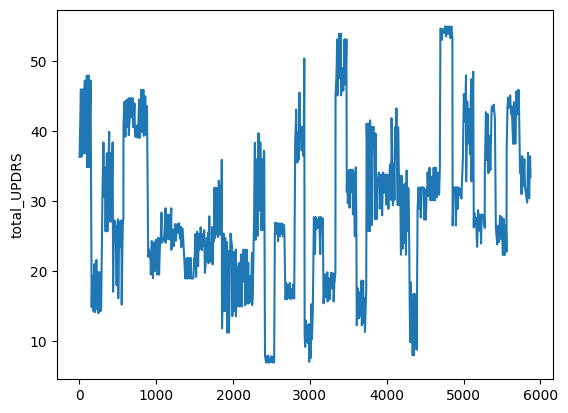

In [35]:
# Gráfica del comportamiento de la variable objetivo
sns.lineplot(data=y_test_reg)

**Cálculo del KNN**

In [36]:
# Se carga el modelo KNN sin entrenar
model_KNNr = KNeighborsRegressor(n_neighbors=3)

# Se entrena el modelo KNN
model_KNNr.fit(X_train_reg, y_train_reg)

# Obtención de la métrica lograda
model_KNNr.score(X_test_reg, y_test_reg)

0.9356364710952155

<Axes: ylabel='total_UPDRS'>

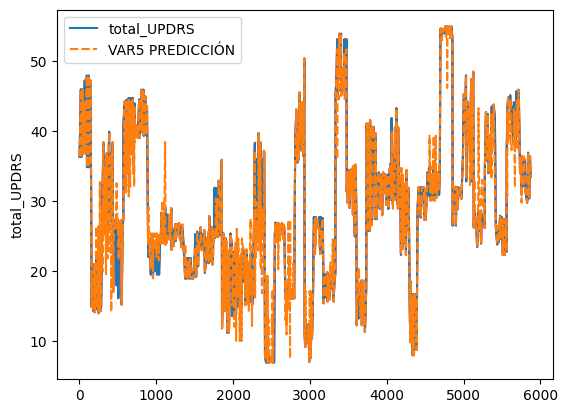

In [37]:
# Gráfica de la variable objetivo real
sns.lineplot(data=y_test_reg,c='r')

# Gráfica de la variable objetivo predicción
y_pred_reg = model_KNNr.predict(X_test_reg)
y_pred_reg = pd.DataFrame(y_pred_reg).set_index(y_test_reg.index)

# Se crea un dataframe 2 columnas con variable real y la predicción
df_test_real_pred = pd.concat([y_test_reg,y_pred_reg],axis=1)
df_test_real_pred.rename(columns={'VAR5':'VAR5 REAL',
                        0:'VAR5 PREDICCIÓN'},inplace=True)

sns.lineplot(data=df_test_real_pred)

# **Creación y ajuste de modelos**

In [38]:
# Creación de los modelos
model_DTr  = DecisionTreeRegressor()
model_Br   = BaggingRegressor()
model_RFr  = RandomForestRegressor()
model_ABr  = AdaBoostRegressor()
model_SVMr = SVR()
model_ETr  = ExtraTreesRegressor()
model_XGBr = XGBRegressor()
model_Lr   = LinearRegression()
model_GBr  = GradientBoostingRegressor()

In [39]:
# Ajustar los modelos a los datos de entrenamiento
model_DTr.fit(X_train_reg, y_train_reg)
model_Br.fit(X_train_reg, y_train_reg)
model_RFr.fit(X_train_reg, y_train_reg)
model_ABr.fit(X_train_reg, y_train_reg)
model_SVMr.fit(X_train_reg, y_train_reg)
model_ETr.fit(X_train_reg, y_train_reg)
model_XGBr.fit(X_train_reg, y_train_reg)
model_Lr.fit(X_train_reg, y_train_reg)
model_GBr.fit(X_train_reg, y_train_reg)

GradientBoostingRegressor()

In [40]:
# Predicción y obtención del coeficiente de determinación
print("DTr: ",model_DTr.score(X_test_reg, y_test_reg))
print("Br: ",model_Br.score(X_test_reg, y_test_reg))
print("RFr: ",model_RFr.score(X_test_reg, y_test_reg))
print("ABr: ",model_ABr.score(X_test_reg, y_test_reg))
print("SVMr: ",model_SVMr.score(X_test_reg, y_test_reg))
print("ETr: ",model_ETr.score(X_test_reg, y_test_reg))
print("XGBr: ",model_XGBr.score(X_test_reg, y_test_reg))
print("Lr: ",model_Lr.score(X_test_reg, y_test_reg))
print("GBr: ",model_GBr.score(X_test_reg, y_test_reg))

DTr:  0.9976973859071347
Br:  0.9975340449146554
RFr:  0.9987159856333907
ABr:  0.6720580933988803
SVMr:  0.14292525937779466
ETr:  0.9993765454183047
XGBr:  0.9963353627156952
Lr:  0.26103969730380205
GBr:  0.9344220695163497


# **Regresión para segunda variable objetivo con los datos originales**

In [41]:
# Se almacena la variable features en un dataframe llamado df_1
df_1=features
df_1

,subject#,age,sex,test_time,Jitter_ptg,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,Shimmer,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,42,61,0,142.7900,0.00406,0.000031,0.00167,0.00168,0.00500,0.01896,0.160,0.00973,0.01133,0.01549,0.02920,0.025137,22.369,0.64215,0.55314,0.21367
5871,42,61,0,149.8400,0.00297,0.000025,0.00119,0.00147,0.00358,0.02315,0.215,0.01052,0.01277,0.01904,0.03157,0.011927,22.886,0.52598,0.56518,0.12621
5872,42,61,0,156.8200,0.00349,0.000025,0.00152,0.00187,0.00456,0.02499,0.244,0.01371,0.01456,0.01877,0.04112,0.017701,25.065,0.47792,0.57888,0.14157
5873,42,61,0,163.7300,0.00281,0.000020,0.00128,0.00151,0.00383,0.01484,0.131,0.00693,0.00870,0.01307,0.02078,0.007984,24.422,0.56865,0.56327,0.14204


In [42]:
# Se obtienen las características de la segundaa variable objetivo
features_2 = df.drop(['total_UPDRS'], axis=1)
features_2.head(10)

,subject#,age,sex,test_time,motor_UPDRS,Jitter_ptg,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,...,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,28.199,0.00662,0.000034,0.00401,0.00317,0.01204,...,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,28.447,0.00300,0.000017,0.00132,0.00150,0.00395,...,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,28.695,0.00481,0.000025,0.00205,0.00208,0.00616,...,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,28.905,0.00528,0.000027,0.00191,0.00264,0.00573,...,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,29.187,0.00335,0.000020,0.00093,0.00130,0.00278,...,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
5,1,72,0,40.6520,29.435,0.00353,0.000023,0.00119,0.00159,0.00357,...,0.214,0.01006,0.01337,0.02263,0.03019,0.009438,22.946,0.53949,0.57243,0.19500
6,1,72,0,47.6490,29.682,0.00422,0.000024,0.00212,0.00221,0.00637,...,0.445,0.02376,0.02621,0.03488,0.07128,0.013260,22.506,0.49250,0.54779,0.17563
7,1,72,0,54.6400,29.928,0.00476,0.000025,0.00226,0.00259,0.00678,...,0.212,0.00979,0.01462,0.01911,0.02937,0.027969,22.929,0.47712,0.54234,0.23844
8,1,72,0,61.6690,30.177,0.00432,0.000029,0.00156,0.00207,0.00468,...,0.371,0.01774,0.02134,0.03451,0.05323,0.013381,22.078,0.51563,0.61864,0.20037
9,1,72,0,68.6880,30.424,0.00496,0.000027,0.00258,0.00253,0.00773,...,0.310,0.02030,0.01970,0.02569,0.06089,0.018021,22.606,0.50032,0.58673,0.20117


In [43]:
# Obtención de etiquetas de la variable objetivo a la que se le aplicará la regresión
labels = features_2['motor_UPDRS']
labels.head()

0    28.199
1    28.447
2    28.695
3    28.905
4    29.187
Name: motor_UPDRS, dtype: float64

In [44]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(features_2, labels,
                                                    test_size=0.20, random_state=1)

In [45]:
# Verificacion de la cantidad de datos para entrenamiento y para prueba
print("y_train labels unique:",np.unique(y_train, return_counts=True))
print("y_test labels unique: ",np.unique(y_test, return_counts=True))

y_train labels unique: (array([ 5.0377,  5.0378,  5.1375, ..., 37.664 , 37.957 , 39.511 ]), array([3, 2, 3, ..., 5, 5, 5]))
y_test labels unique:  (array([ 5.0378,  5.5373,  5.8371,  5.9369,  5.994 ,  5.9941,  6.    ,
        6.0102,  6.2347,  6.3846,  6.5408,  6.6924,  6.9987,  7.063 ,
        7.1038,  7.3451,  7.4545,  7.4546,  7.6165,  7.6466,  7.924 ,
        8.0103,  8.1633,  8.1853,  8.2199,  8.3098,  8.3171,  8.318 ,
        8.3181,  8.3883,  8.4496,  8.4671,  8.5458,  8.55  ,  8.6249,
        8.6516,  8.703 ,  8.7208,  8.7788,  8.7817,  8.8604,  8.9324,
        8.9325,  8.939 ,  8.9886,  9.0863,  9.0904,  9.0906,  9.2596,
        9.2893,  9.2894,  9.3273,  9.3274,  9.3742,  9.5479,  9.6153,
        9.635 ,  9.6352,  9.7017,  9.7558,  9.7995,  9.94  ,  9.9456,
        9.9457, 10.029 , 10.115 , 10.141 , 10.169 , 10.179 , 10.281 ,
       10.334 , 10.359 , 10.45  , 10.529 , 10.559 , 10.615 , 10.723 ,
       10.724 , 10.737 , 10.768 , 10.782 , 10.876 , 10.906 , 11.078 ,
       11.11

In [46]:
# Seleccionando datos para hacer la regresión de una de las variables objetivo
## Entrenamiento
X_train_reg = X_train.drop(['motor_UPDRS'], axis=1)
y_train_reg = X_train['motor_UPDRS']

## Prueba
X_test_reg = X_test.drop(['motor_UPDRS'], axis=1)
y_test_reg = X_test['motor_UPDRS']

<Axes: ylabel='motor_UPDRS'>

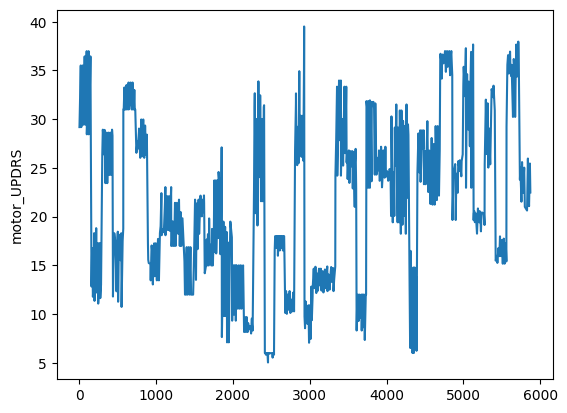

In [47]:
# Gráfica del comportamiento de la variable objetivo
sns.lineplot(data=y_test_reg)

In [48]:
# Se carga el modelo KNN sin entrenar
model_KNNr = KNeighborsRegressor(n_neighbors=3)

# Se entrena el modelo KNN
model_KNNr.fit(X_train_reg, y_train_reg)

# Obtención de la métrica lograda
model_KNNr.score(X_test_reg, y_test_reg)

0.9198009443643973

<Axes: ylabel='motor_UPDRS'>

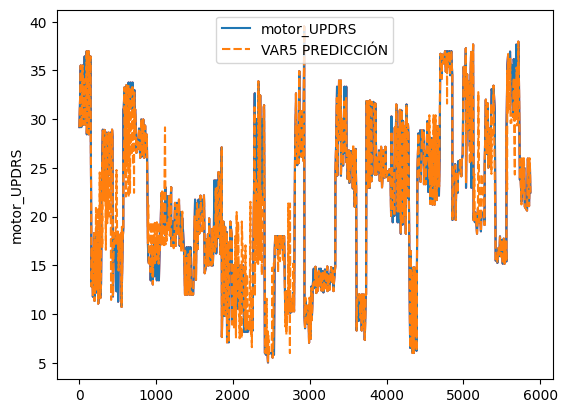

In [49]:
# Gráfica de la variable objetivo real
sns.lineplot(data=y_test_reg,c='r')

# Gráfica de la variable objetivo predicción
y_pred_reg = model_KNNr.predict(X_test_reg)
y_pred_reg = pd.DataFrame(y_pred_reg).set_index(y_test_reg.index)

# Creando un dataframe 2 columnas con variable real y la predicción
df_test_real_pred = pd.concat([y_test_reg,y_pred_reg],axis=1)
df_test_real_pred.rename(columns={'VAR5':'VAR5 REAL',
                        0:'VAR5 PREDICCIÓN'},inplace=True)

sns.lineplot(data=df_test_real_pred)

# **Creación y ajuste de modelos**

In [50]:
# Creación de los modelos
model_DTr  = DecisionTreeRegressor()
model_Br   = BaggingRegressor()
model_RFr  = RandomForestRegressor()
model_ABr  = AdaBoostRegressor()
model_SVMr = SVR()
model_ETr  = ExtraTreesRegressor()
model_XGBr = XGBRegressor()
model_Lr   = LinearRegression()
model_GBr  = GradientBoostingRegressor()

In [51]:
# Ajustar los modelos a la data de entrenamiento
model_DTr.fit(X_train_reg, y_train_reg)
model_Br.fit(X_train_reg, y_train_reg)
model_RFr.fit(X_train_reg, y_train_reg)
model_ABr.fit(X_train_reg, y_train_reg)
model_SVMr.fit(X_train_reg, y_train_reg)
model_ETr.fit(X_train_reg, y_train_reg)
model_XGBr.fit(X_train_reg, y_train_reg)
model_Lr.fit(X_train_reg, y_train_reg)
model_GBr.fit(X_train_reg, y_train_reg)

GradientBoostingRegressor()

In [52]:
# Predecir y obtener el coeficiente de determinación
print("DTr: ",model_DTr.score(X_test_reg, y_test_reg))
print("Br: ",model_Br.score(X_test_reg, y_test_reg))
print("RFr: ",model_RFr.score(X_test_reg, y_test_reg))
print("ABr: ",model_ABr.score(X_test_reg, y_test_reg))
print("SVMr: ",model_SVMr.score(X_test_reg, y_test_reg))
print("ETr: ",model_ETr.score(X_test_reg, y_test_reg))
print("XGBr: ",model_XGBr.score(X_test_reg, y_test_reg))
print("Lr: ",model_Lr.score(X_test_reg, y_test_reg))
print("GBr: ",model_GBr.score(X_test_reg, y_test_reg))

DTr:  0.9968396311155184
Br:  0.9976788915847871
RFr:  0.9981920713281168
ABr:  0.630218592848483
SVMr:  0.14422259559791417
ETr:  0.999242846288035
XGBr:  0.9953619480062401
Lr:  0.2154891807608198
GBr:  0.9281089369270569


# **PCA al 96%**

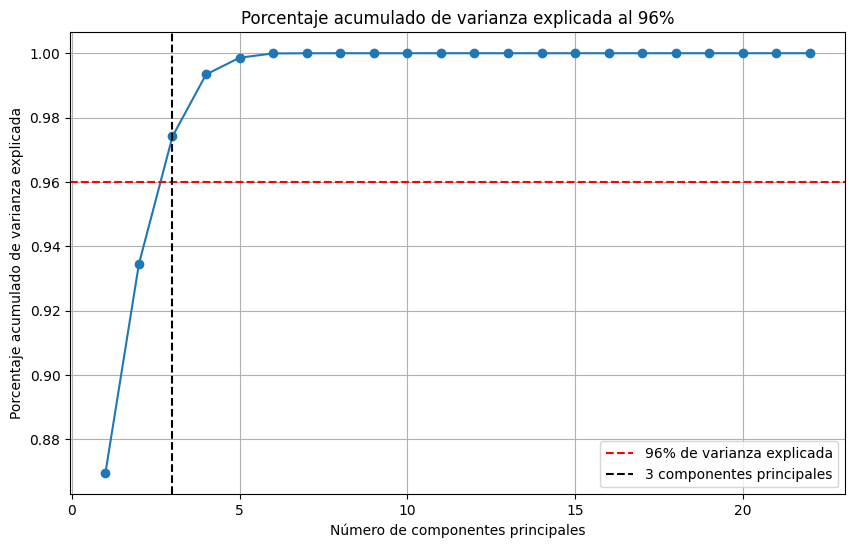

In [53]:
# Inicialización de PCA
pca = PCA()

# Ajuste del PCA a los datos
pca.fit(df)

# Se calcula la varianza explicada acumulativa
varianza_explicada_acumulativa = np.cumsum(pca.explained_variance_ratio_)

# Se encuentra el número de componentes necesarias para alcanzar el 96% de varianza explicada
n_componentes = np.argmax(varianza_explicada_acumulativa >= 0.96) + 1

# Se aplica PCA con el número seleccionado de componentes principales
pca_final = PCA(n_components=n_componentes)
datos_transformados = pca_final.fit_transform(df)


# Se realiza la grafica del porcentaje acumulado de varianza explicada
plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(varianza_explicada_acumulativa) + 1), varianza_explicada_acumulativa, marker='o', linestyle='-')
plt.title('Porcentaje acumulado de varianza explicada al 96%')
plt.xlabel('Número de componentes principales')
plt.ylabel('Porcentaje acumulado de varianza explicada')
plt.axhline(y=0.96, color='red', linestyle='--', label='96% de varianza explicada')
plt.axvline(x=n_componentes, color='black', linestyle='--', label=f'{n_componentes} componentes principales')
plt.legend()
plt.grid(True)
plt.show()

# **Verificación de todos los modelos con una variable objetivo y con PCA al 96%**

In [54]:
# Se obtienen las etiquetas de la priemr variable objetivo
labels = df['total_UPDRS']
labels.head()

0    34.398
1    34.894
2    35.389
3    35.810
4    36.375
Name: total_UPDRS, dtype: float64

In [56]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo DecisionTreeRegressor
modelo = DecisionTreeRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 0.2364830989702128
R²: 0.9978659272240603


In [57]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo BaggingRegressor
modelo = BaggingRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 0.11390111160263831
R²: 0.9989721326281711


In [58]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo RandomForestRegressor
modelo = RandomForestRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 0.06942664958490802
R²: 0.9993734794433554


In [59]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo AdaBoostRegressor
modelo = AdaBoostRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 5.527400640456653
R²: 0.9501195845289727


In [60]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo SVR
modelo = SVR()
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 6.88845609903156
R²: 0.9378371363822038


In [61]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo ExtraTreesRegressor
modelo = ExtraTreesRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 0.032211919649694935
R²: 0.9997093129230609


In [62]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo XGBRegressor
modelo = XGBRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 0.1074758682405324
R²: 0.9990301153635022


In [63]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo LinearRegression
modelo = LinearRegression()
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 6.518517114262998
R²: 0.9411755428881707


In [64]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo GradientBoostingRegressor
modelo = GradientBoostingRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 2.0916138046961854
R²: 0.9811248410655171


# **Verificación de todos los modelos con la otra variable objetivo y con PCA al 96%**

In [65]:
# Se obtienen las etiquetas
labels = df['motor_UPDRS']
labels.head()

0    28.199
1    28.447
2    28.695
3    28.905
4    29.187
Name: motor_UPDRS, dtype: float64

In [66]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo DecisionTreeRegressor
modelo = DecisionTreeRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 0.27756687708085104
R²: 0.9956514140150197


In [67]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo BaggingRegressor
modelo = BaggingRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 0.2483905518863831
R²: 0.9961085137964065


In [68]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo RandomForestRegressor
modelo = RandomForestRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 0.20453298732424177
R²: 0.9967956216840481


In [69]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo AdaBoostRegressor
modelo = AdaBoostRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 5.261296271634537
R²: 0.9175723001595951


In [70]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo SVR
modelo = SVR()
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 6.706446500284704
R²: 0.894931414126682


In [71]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo ExtraTreesRegressor
modelo = ExtraTreesRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 0.06709062259586386
R²: 0.9989489043353722


In [72]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo XGBRegressor
modelo = XGBRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 0.16736914581470516
R²: 0.9973778603215832


In [73]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo LinearRegression
modelo = LinearRegression()
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 7.0730975343096905
R²: 0.8891871640752784


In [75]:
# Separación de la datos, con un 20% para prueba, y 80% para entrenamiento
X_train, X_test, y_train, y_test = train_test_split(datos_transformados, labels, test_size=0.2, random_state=42)

# Se crea y entrena el modelo GradientBoostingRegressor
modelo = GradientBoostingRegressor(random_state=42)
modelo.fit(X_train, y_train)

# Se realizan predicciones
y_pred = modelo.predict(X_test)

# Evaluación del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}')
print(f'R²: {r2}')

MSE: 2.6627117311932342
R²: 0.9582838160010833
